## Load packages

In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from brainspace.utils.parcellation import map_to_labels
import hcp_utils as hcp
from matplotlib.colors import ListedColormap
import scipy.stats as ss
from brainstat.stats.terms import FixedEffect
from brainstat.stats.SLM import SLM
from neuroCombat import neuroCombat
import cmasher as cmr
import func_utils as fu
fdr = fu.fdr
se = fu.se
sub_corr = fu.sub_corr
plot_corr_bar = fu.plot_corr_bar
compare = fu.compare

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [2]:
cmap_brain = ListedColormap(np.vstack(([211/256, 211/256, 211/256, 1], fu.rgb)))
cmap = ListedColormap(fu.rgb)
ca = np.array(pd.read_csv('../data/ca_glasser_network.csv',header=None))[:,0].astype(float)
color = ca[:180]
datasite =['NYU','Pitt','USM', 'NYU_II','TCD']

In [3]:
mmp_ll = fu.mmp_ll
phen = fu.phen
phen

,ID,group,site,age,FIQ,ados_comm,ados_social,ados_rrb,meanFD
0,29096,ASD,TCD,15.50,98,2,5,0,0.165400
1,29099,ASD,TCD,10.75,123,3,5,0,0.148400
2,29101,ASD,TCD,14.00,103,3,4,0,0.248200
3,29103,ASD,TCD,14.75,108,4,3,0,0.161700
4,29104,ASD,TCD,19.25,119,3,13,1,0.066200
...,...,...,...,...,...,...,...,...,...
278,32641,ASD,USM,18.25,106,4,9,1,0.175961
279,32643,ASD,USM,16.92,84,1,11,0,0.122636
280,32646,ASD,USM,20.17,108,3,5,0,0.062141
281,32647,ASD,USM,32.55,126,4,6,0,0.121629


## LL part

In [4]:
variance = np.array(pd.read_csv('../results/grad/group_grad_LL_lambdas.csv',header=None))
explain = variance/np.sum(variance)
explain

array([[0.24128904],
       [0.18401363],
       [0.15086323],
       [0.09895598],
       [0.08759217],
       [0.07340464],
       [0.05616395],
       [0.04132282],
       [0.03446645],
       [0.03192809]])

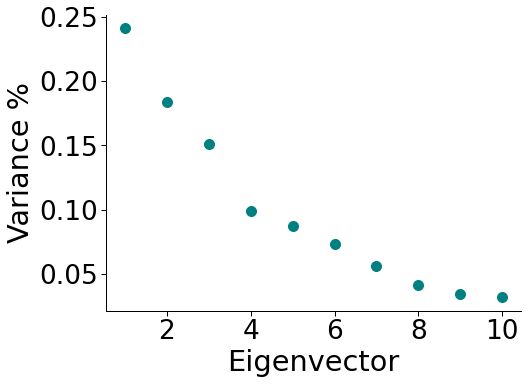

In [5]:
sns.set_context("paper", font_scale = 3)
fig, ax = plt.subplots(figsize=(8,6))
ax.plot(range(1,11),explain,'o',color='teal', ms=10)
plt.xlabel('Eigenvector')
plt.ylabel('Variance %')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.tight_layout()
plt.savefig('../figures/template_explain.png', dpi=300, transparent=True)

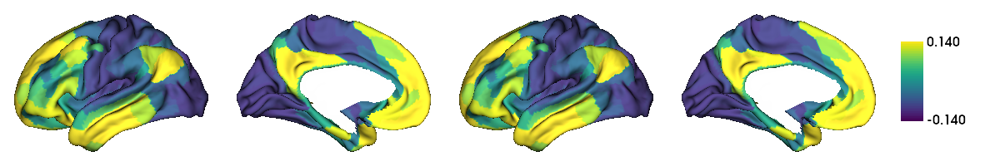

In [6]:
G1 = np.array(pd.read_csv('../results/grad/group_grad_LL.csv',header=None))[:,0]
mask = mmp_ll != 0
group_level = map_to_labels(np.concatenate((G1,G1)), mmp_ll, mask=mask)
group_level[group_level==0]=np.nan

fu.plot_surface_ll(data=group_level, size=(1200,200), cmap='viridis', color_range=(-0.14, 0.14), 
                   filename='../figures/group_grad_ll_g1.png')

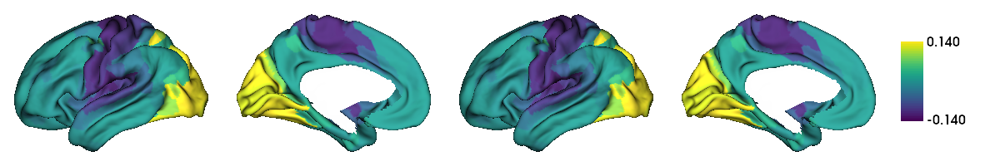

In [7]:
G2 = np.array(pd.read_csv('../results/grad/group_grad_LL.csv',header=None))[:,1]
group_level = map_to_labels(np.concatenate((G2,G2)), mmp_ll, mask=mask)
group_level[group_level==0]=np.nan
fu.plot_surface_ll(data=group_level, size=(1200,200), cmap='viridis', color_range=(-0.14, 0.14), 
                   filename='../figures/group_grad_ll_g2.png')

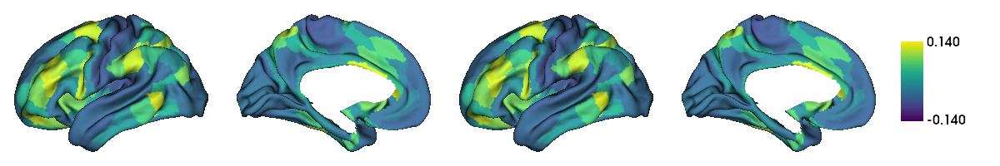

In [8]:
G3 = np.array(pd.read_csv('../results/grad/group_grad_LL.csv',header=None))[:,2]
group_level = map_to_labels(np.concatenate((G3,G3)), mmp_ll, mask=mask)
group_level[group_level==0]=np.nan

fu.plot_surface_ll(data=group_level, size=(1200,200), cmap='viridis', color_range=(-0.14, 0.14), 
                   filename='../figures/group_grad_ll_g3.png')

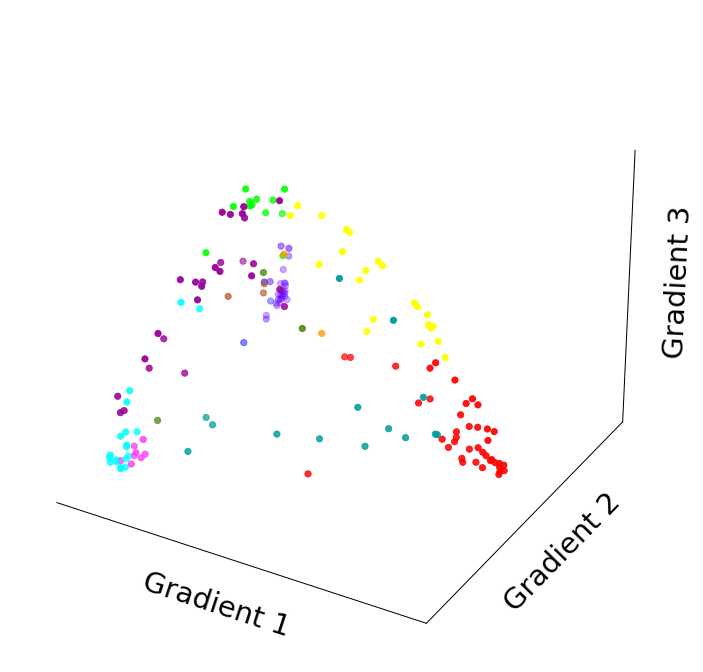

In [9]:
sns.set_context("paper", font_scale = 3)
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.gca().patch.set_facecolor('white')
ax.w_xaxis.set_pane_color((1, 1, 1, 0))
ax.w_yaxis.set_pane_color((1, 1, 1, 0))
ax.w_zaxis.set_pane_color((1, 1, 1, 0))
ax.set_xticks(np.arange(-0.14, 0.14, 0.04))
ax.set_yticks(np.arange(-0.14, 0.14, 0.04))
ax.set_zticks(np.arange(-0.14, 0.14, 0.04))
ax.set_xlabel('Gradient 1',labelpad=10)
ax.set_ylabel('Gradient 2',labelpad=10)
ax.set_zlabel('Gradient 3',labelpad=10)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.grid(False)
ax.scatter(G1, G2, G3, s = 40, c = color, cmap=cmap, marker = 'o')
fig.tight_layout()
fig.savefig('../figures/hcp_template_3d.png', dpi=300, transparent=True)

In [10]:
path = '../results/grad/LL/'
path_list = os.listdir(path)
path_list.sort()
n = len(path_list)
LL = [None] * n
total = np.zeros((180,3))

for i in range(n):
  LL[i] = np.array(pd.read_csv(path+path_list[i], header=None))[:,:3]
  total += LL[i]

mean_LL = total/n

In [11]:
[mean_LL[:,0].max(), mean_LL[:,0].min(),
 mean_LL[:,1].max(), mean_LL[:,1].min(),
 mean_LL[:,2].max(), mean_LL[:,2].min()]

[0.1097549567409836,
 -0.07575455507346616,
 0.12585416669935828,
 -0.09316989405781906,
 0.07795355087701035,
 -0.046175430935104206]

In [12]:
[ss.pearsonr(G1, mean_LL[:,0]), fu.spin_pearson(G1, mean_LL[:,0]),
 ss.pearsonr(G2, mean_LL[:,1]), fu.spin_pearson(G2, mean_LL[:,1]),
 ss.pearsonr(G3, mean_LL[:,2]), fu.spin_pearson(G3, mean_LL[:,2])]

[(0.9536539562457202, 9.058511820677834e-95),
 0.0,
 (0.9553603412455292, 3.467887111978103e-96),
 0.0,
 (0.8813743896425423, 7.2518267873015e-60),
 0.0]

In [13]:
# cohen's d of HCP
hcp_cohen = \
[np.array(pd.read_csv('../../evolution/results/gradient/intra_g1_stats.csv'))[:,1]/pow(1014, 0.5),
 np.array(pd.read_csv('../../evolution/results/gradient/intra_g2_stats.csv'))[:,1]/pow(1014, 0.5),
 np.array(pd.read_csv('../../evolution/results/gradient/intra_g3_stats.csv'))[:,1]/pow(1014, 0.5),
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g1_stats.csv'))[:,1]/pow(1014, 0.5),
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g2_stats.csv'))[:,1]/pow(1014, 0.5),
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g3_stats.csv'))[:,1]/pow(1014, 0.5)]

hcp_p = \
[np.array(pd.read_csv('../../evolution/results/gradient/intra_g1_stats.csv'))[:,2],
 np.array(pd.read_csv('../../evolution/results/gradient/intra_g2_stats.csv'))[:,2],
 np.array(pd.read_csv('../../evolution/results/gradient/intra_g3_stats.csv'))[:,2],
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g1_stats.csv'))[:,2],
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g2_stats.csv'))[:,2],
 np.array(pd.read_csv('../../evolution/results/gradient/inter_g3_stats.csv'))[:,2]]


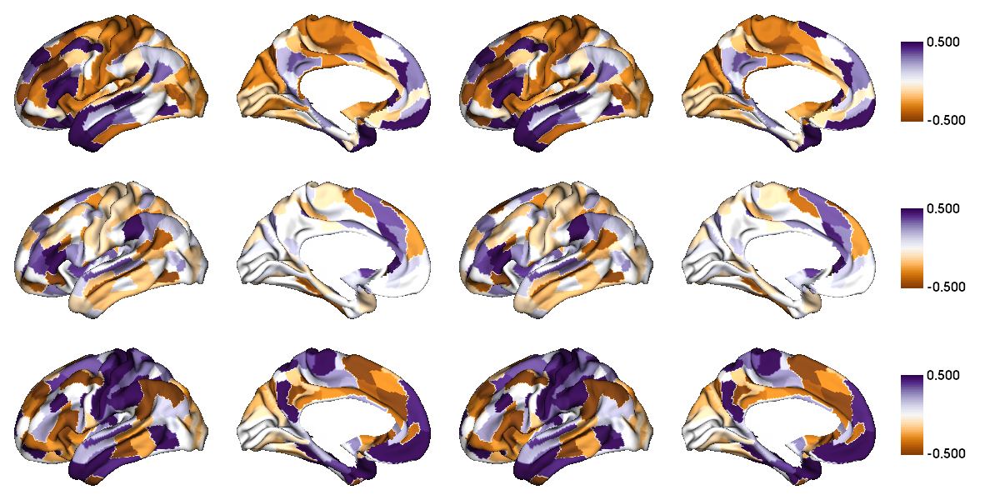

In [14]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  a = hcp_cohen[i].copy()
  a[fdr(hcp_p[i])>0.05] = 0.000001
  grad[i] = map_to_labels(np.concatenate((a,a)), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/hcp_cohen_intra.png')

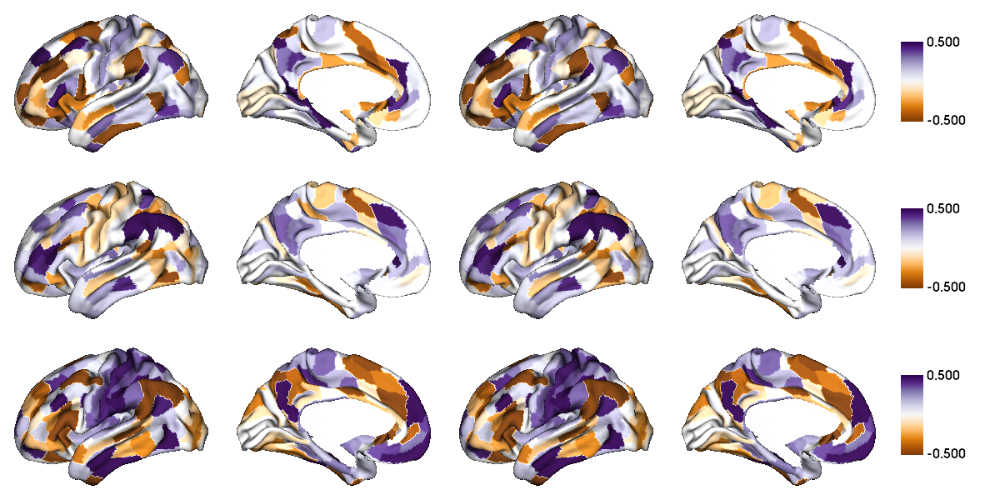

In [15]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  a = hcp_cohen[i+3].copy()
  a[fdr(hcp_p[i+3])>0.05] = 0.000001
  grad[i] = map_to_labels(np.concatenate((a,a)), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/hcp_cohen_inter.png')

## data harmony

In [16]:
def harmony(data):
    data_combat = neuroCombat(dat=data.T, mean_only= True,
                              covars=cov,
                              batch_col='site',
                              continuous_cols=['age'])['data']
    return data_combat.T

In [17]:
cov = phen[['site', 'age']]
cov

,site,age
0,TCD,15.50
1,TCD,10.75
2,TCD,14.00
3,TCD,14.75
4,TCD,19.25
...,...,...
278,USM,18.25
279,USM,16.92
280,USM,20.17
281,USM,32.55


# Intra asymmetry

In [18]:
path = '../results/GSR/grad/intra/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


## ASD

In [19]:
asd_pos = np.where(phen['group']=='ASD')[0]
matrix = matrix_total[asd_pos]
np.savetxt('../results/GSR/mean_sd_asd_intra.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)), axis=1))

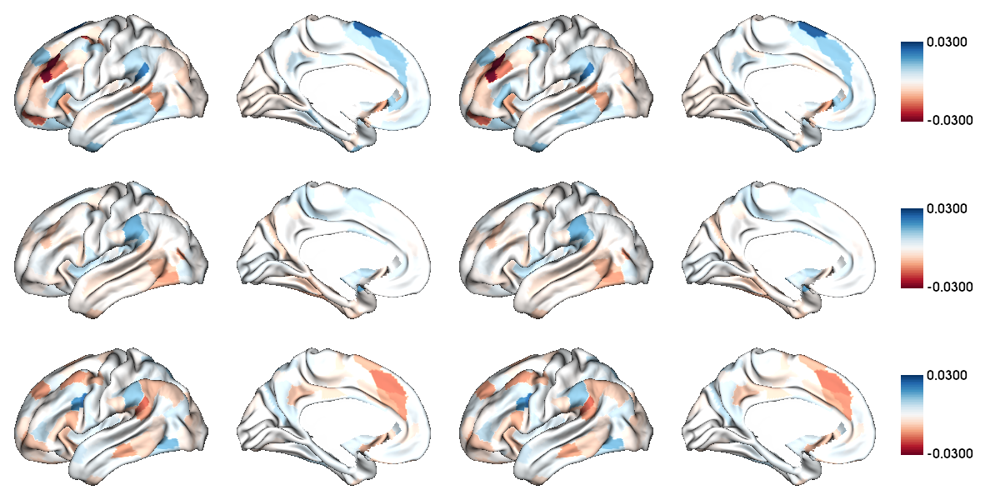

In [20]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/GSR/asd_intra_AI_GSR.png')

In [21]:
asd_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    asd_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
asd_stat.T[0] = asd_stat.T[0]/pow(matrix.shape[0], 0.5)
asd_stat.T[1].T[0] = fdr(asd_stat.T[1].T[0])
asd_stat.T[1].T[1] = fdr(asd_stat.T[1].T[1])
asd_stat.T[1].T[2] = fdr(asd_stat.T[1].T[2])
asd_stat.T[1][asd_stat.T[1]>0.05] = 1
np.savetxt('../results/GSR/asd_stat_intra_cohen_pfdr.csv', 
           np.concatenate((asd_stat.T[0],asd_stat.T[1]), axis=1))

asd_stat.T[0][asd_stat.T[1]>0.05] = 0.00001

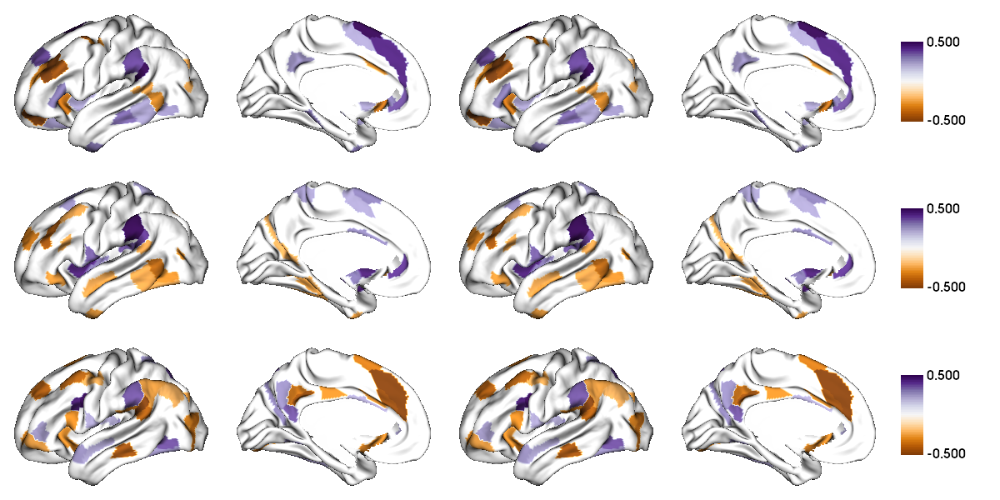

In [22]:
data = asd_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/GSR/asd_intra_cohen.png')

## Control

In [23]:
con_pos = np.where(phen['group']=='CONTROL')[0]
matrix = matrix_total[con_pos]
np.savetxt('../results/GSR/mean_sd_con_intra.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)), axis=1))

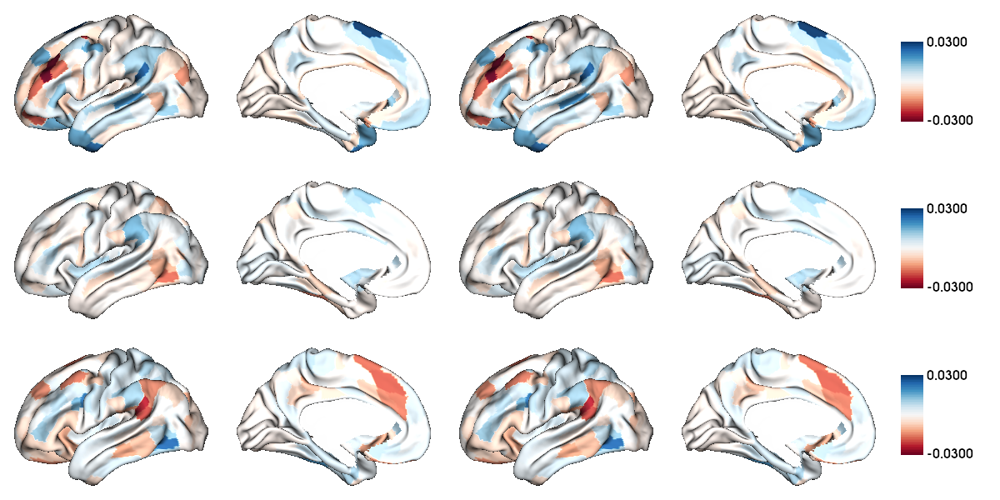

In [24]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan
fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/GSR/con_intra_AI.png')

In [25]:
con_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    con_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
con_stat.T[0] = con_stat.T[0]/pow(matrix.shape[0], 0.5)
con_stat.T[1].T[0] = fdr(con_stat.T[1].T[0])
con_stat.T[1].T[1] = fdr(con_stat.T[1].T[1])
con_stat.T[1].T[2] = fdr(con_stat.T[1].T[2])
con_stat.T[1][con_stat.T[1]>0.05] = 1
np.savetxt('../results/GSR/con_stat_intra_cohen_pfdr.csv', 
           np.concatenate((con_stat.T[0],con_stat.T[1]), axis=1))

con_stat.T[0][con_stat.T[1]>0.05] = 0.00001

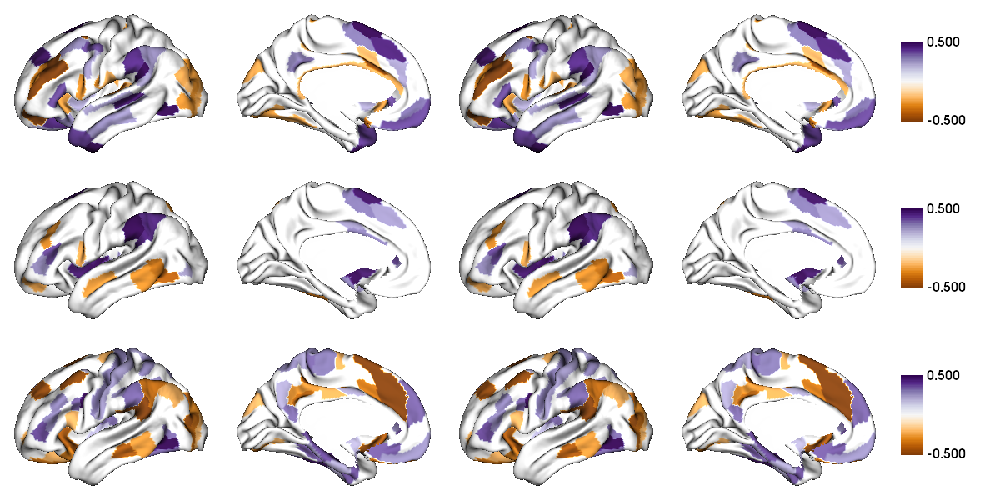

In [26]:
data = con_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/GSR/con_intra_cohen.png')

## Datasite

### stats

In [27]:
intra_asd_g1 = sub_corr(path = '../results/GSR/grad/intra/', group = 'ASD', grad=0)
intra_con_g1 = sub_corr(path = '../results/GSR/grad/intra/', group = 'CONTROL', grad=0)
compare(intra_asd_g1, intra_con_g1, '../results/GSR/compare_t_p_intra_g1.csv')

every_site: [Ttest_indResult(statistic=-1.0266648930563684, pvalue=0.30471120868261076), Ttest_indResult(statistic=-2.371999448161224, pvalue=0.018218796054998727), Ttest_indResult(statistic=-5.866783286585325, pvalue=5.329773254046243e-09), Ttest_indResult(statistic=-2.667106255185672, pvalue=0.007925951657939485), Ttest_indResult(statistic=-0.3169886901099641, pvalue=0.7515289054068767)] 
 total: Ttest_indResult(statistic=-5.69266204176724, pvalue=1.3280305219696615e-08)


separate: [[0.07081366536166349, 0.08351058684542052, 0.05872419232234253, 0.0688161842918671, 0.13034899120546775], [0.005444690768845227, 0.012769715692833063, 0.004063087570503582, 0.008987561841875989, 0.017684753111887767]] total: [0.06886930823307524, 0.003011990970829931]


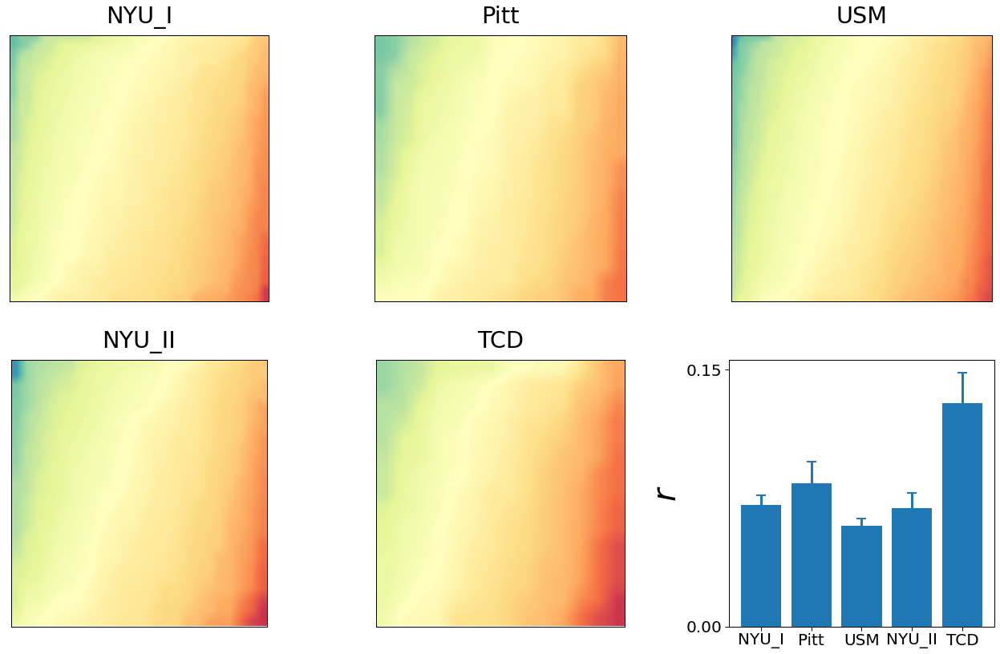

In [28]:
plot_corr_bar(intra_asd_g1, 'GSR_indi_asd_corr_intra_g1_site.png')

separate: [[0.0676861719143068, 0.11012390684037396, 0.09798920116055458, 0.1134373322165245, 0.12808626185771443], [0.003357855430451938, 0.012042417320502829, 0.00506699752798723, 0.01333915201109526, 0.014796960467378403]] total: [0.08589587348767694, 0.002740011894400927]


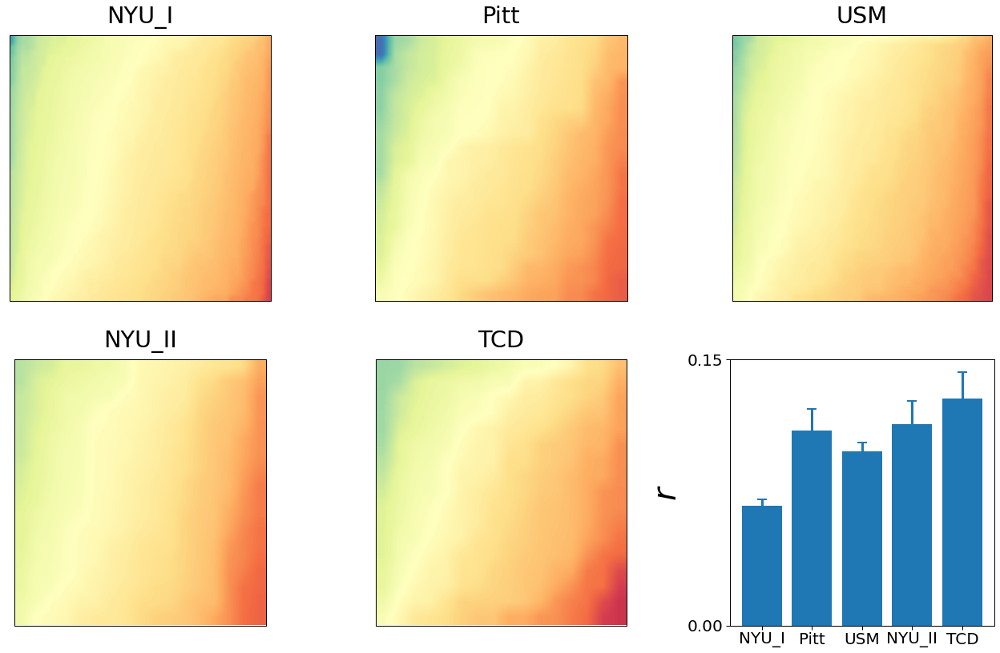

In [29]:
plot_corr_bar(intra_con_g1, 'GSR_indi_con_corr_intra_g1_site.png')

In [30]:
intra_asd_g2 = sub_corr(path = '../results/GSR/grad/intra/', group = 'ASD', grad=1)
intra_con_g2 = sub_corr(path = '../results/GSR/grad/intra/', group = 'CONTROL', grad=1)
compare(intra_asd_g2, intra_con_g2, '../results/GSR/compare_t_p_intra_g2.csv')

every_site: [Ttest_indResult(statistic=0.14761225322617674, pvalue=0.8826647147413874), Ttest_indResult(statistic=1.087958183454488, pvalue=0.2773434238067966), Ttest_indResult(statistic=-0.18086536221759594, pvalue=0.8564948291089587), Ttest_indResult(statistic=-2.1899380173637732, pvalue=0.029040216398596004), Ttest_indResult(statistic=0.44715735491378666, pvalue=0.6551664147136101)] 
 total: Ttest_indResult(statistic=-0.027836167619192186, pvalue=0.9777940207813361)


separate: [[0.05417162577709013, 0.0861877958649096, 0.055402441274382465, 0.043445421870772015, 0.08540442969127834], [0.005692600912326823, 0.01291214123775694, 0.004194896141542425, 0.009158979152836737, 0.01811404036596004]] total: [0.05735390750670721, 0.0030984355265393734]


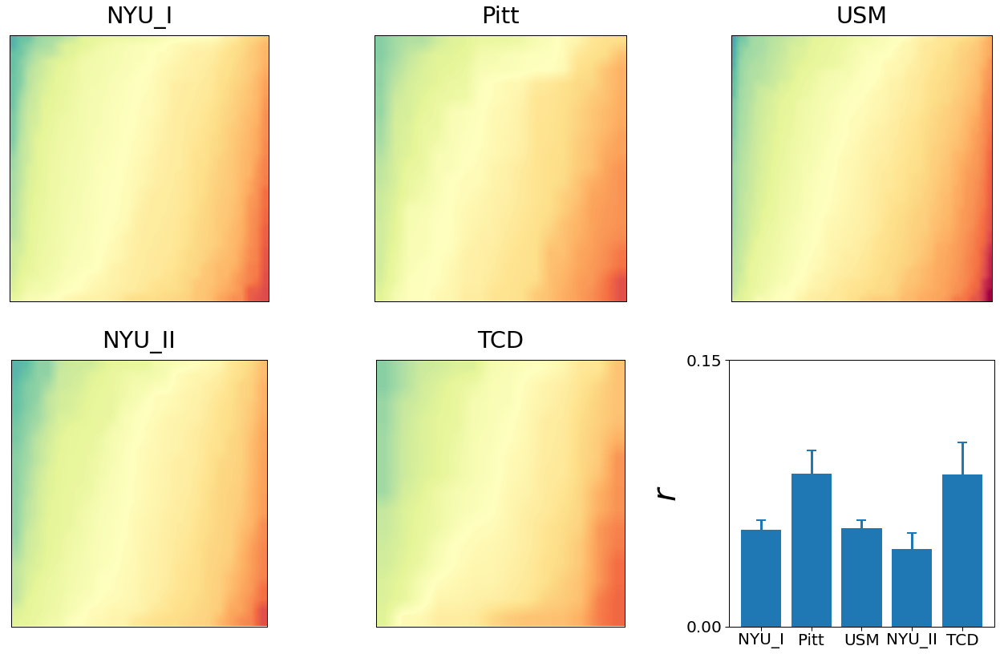

In [31]:
plot_corr_bar(intra_asd_g2, 'GSR_indi_asd_corr_intra_g2_site.png')

separate: [[0.04459101511386359, 0.07088495228540564, 0.06164546632042153, 0.08388629821071367, 0.07060479024761906], [0.0035204460906745395, 0.012033233568909427, 0.005378644397998246, 0.013961085155659006, 0.015732580660381627]] total: [0.05545089296002642, 0.0028587519422043684]


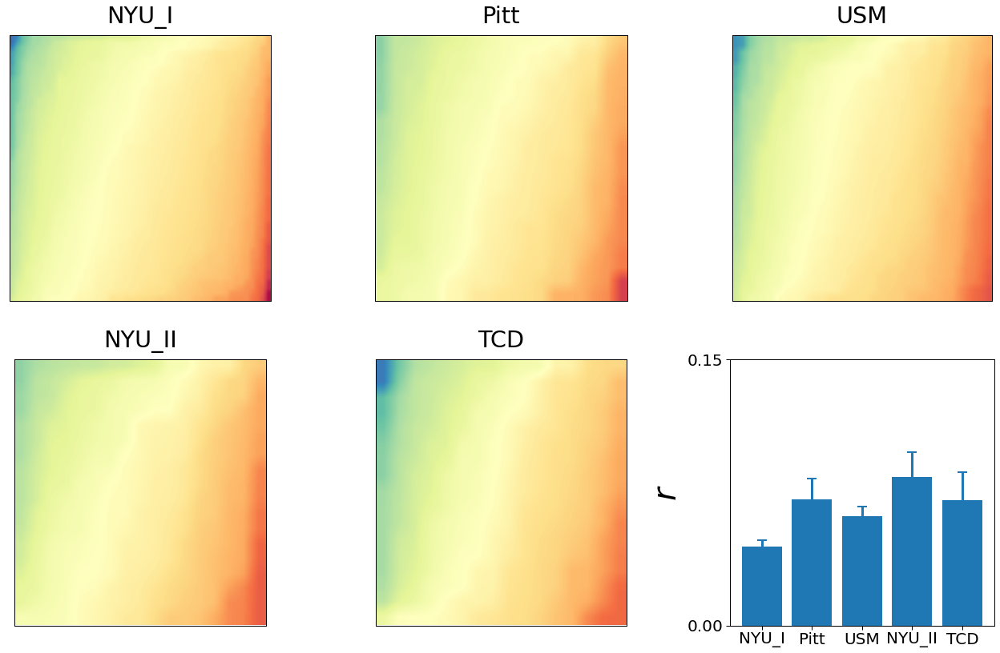

In [32]:
plot_corr_bar(intra_con_g2, 'GSR_indi_con_corr_intra_g2_site.png')

In [33]:
intra_asd_g3 = sub_corr(path = '../results/GSR/grad/intra/', group = 'ASD', grad=2)
intra_con_g3 = sub_corr(path = '../results/GSR/grad/intra/', group = 'CONTROL', grad=2)
compare(intra_asd_g3, intra_con_g3, '../results/GSR/compare_t_p_intra_g3.csv')

every_site: [Ttest_indResult(statistic=-0.9636546776541509, pvalue=0.3353438130363465), Ttest_indResult(statistic=-3.4187283157086688, pvalue=0.0007014067192767168), Ttest_indResult(statistic=-7.338538831632056, pvalue=3.330922413436155e-13), Ttest_indResult(statistic=-0.32477249988590046, pvalue=0.745503849616228), Ttest_indResult(statistic=1.9796419852822091, pvalue=0.04889116364897182)] 
 total: Ttest_indResult(statistic=-6.2807289347298685, pvalue=3.6793648808923724e-10)


separate: [[0.07718781761891137, 0.07888732027278224, 0.04940593011929348, 0.09005473644244187, 0.12815225833343605], [0.005393385066048663, 0.012897579161308553, 0.0040235222140064366, 0.00865159313543019, 0.017199611238377474]] total: [0.06869394018796464, 0.0029784707952004684]


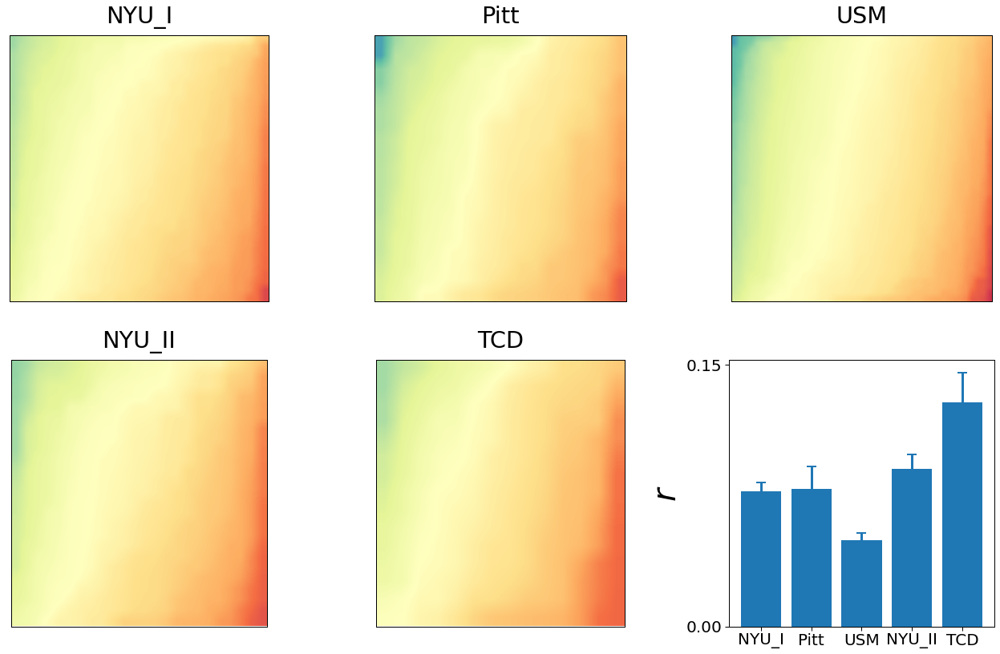

In [34]:
plot_corr_bar(intra_asd_g3, 'GSR_indi_asd_corr_intra_g3_site.png')

separate: [[0.07352406732094538, 0.11587119170251164, 0.09787273340964354, 0.10835044077095726, 0.09468759463194155], [0.003255708145868976, 0.011588457496539611, 0.005253864704139146, 0.013746017570454634, 0.014576427890786033]] total: [0.0871046769975932, 0.0027180191286522055]


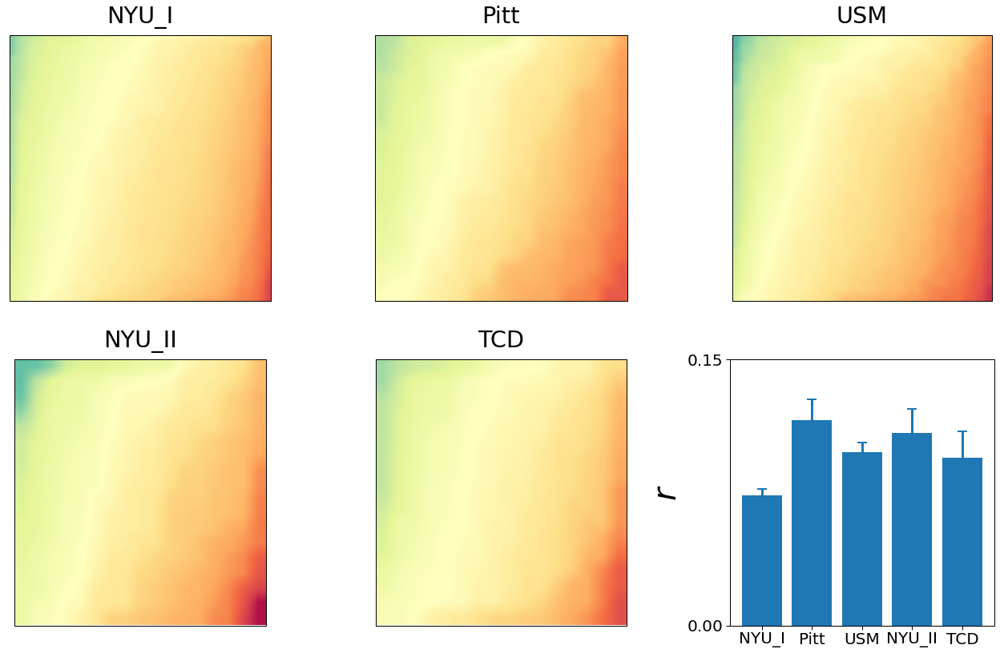

In [35]:
plot_corr_bar(intra_con_g3, 'GSR_indi_con_corr_intra_g3_site.png')

# Inter asymmetry

In [36]:
path = '../results/GSR/grad/inter/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


## ASD

In [37]:
asd_pos = np.where(phen['group']=='ASD')[0]
matrix = matrix_total[asd_pos]
np.savetxt('../results/GSR/mean_sd_asd_inter.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)), axis=1))

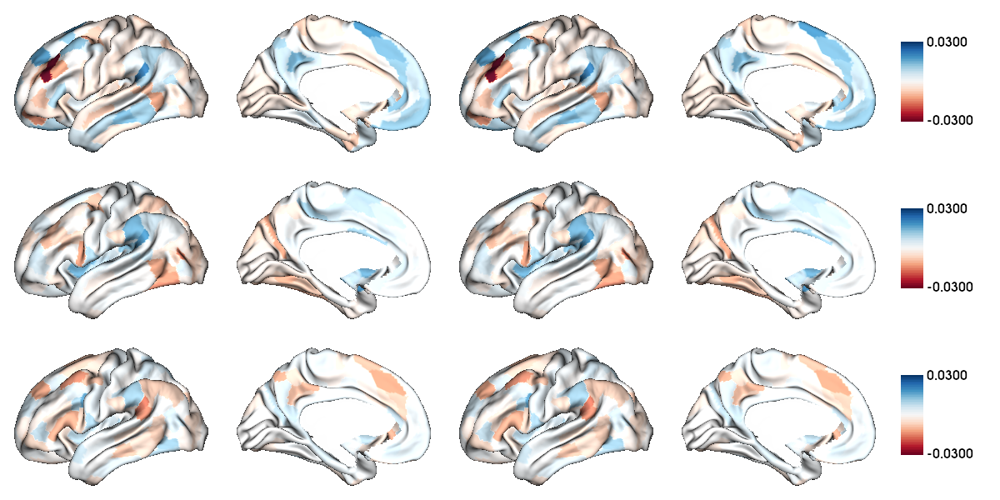

In [38]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/GSR/asd_inter_AI.png')

In [39]:
asd_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    asd_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
asd_stat.T[0] = asd_stat.T[0]/pow(matrix.shape[0], 0.5)
asd_stat.T[1].T[0] = fdr(asd_stat.T[1].T[0])
asd_stat.T[1].T[1] = fdr(asd_stat.T[1].T[1])
asd_stat.T[1].T[2] = fdr(asd_stat.T[1].T[2])
asd_stat.T[1][asd_stat.T[1]>0.05] = 1
np.savetxt('../results/GSR/asd_stat_inter_cohen_pfdr.csv', 
           np.concatenate((asd_stat.T[0],asd_stat.T[1]), axis=1))

asd_stat.T[0][asd_stat.T[1]>0.05] = 0.00001

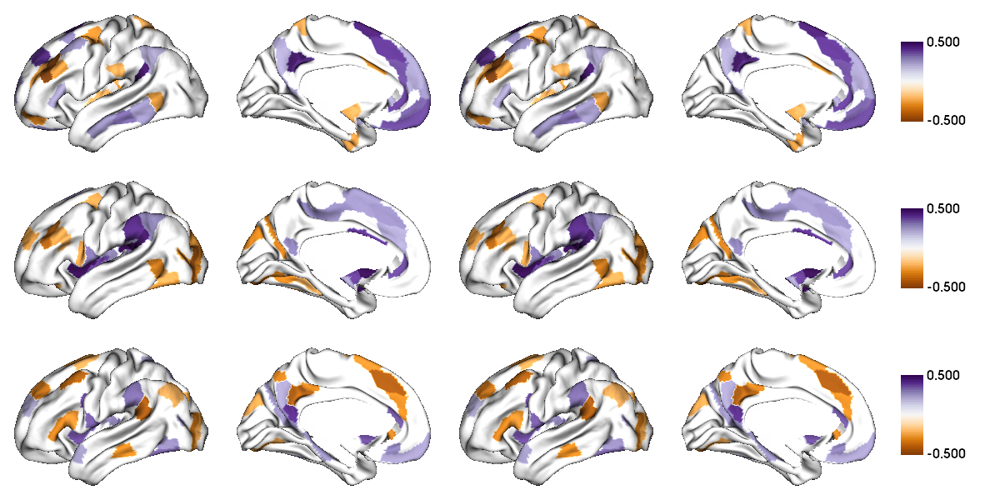

In [40]:
data = asd_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/GSR/asd_inter_cohen.png')

## Control

In [41]:
asd_pos = np.where(phen['group']=='CONTROL')[0]
matrix = matrix_total[asd_pos]
np.savetxt('../results/GSR/mean_sd_con_inter.csv', np.concatenate((matrix.mean(axis=0), 
           matrix.std(axis=0)),axis=1))

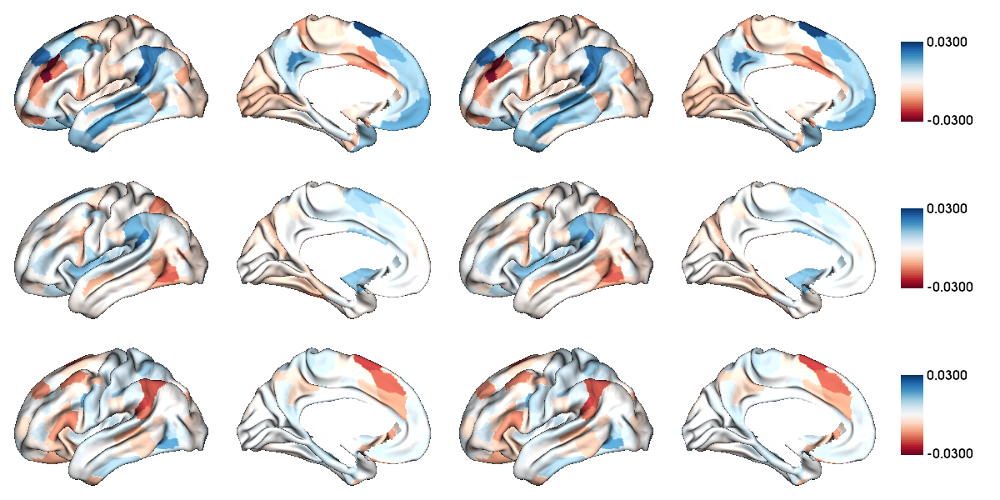

In [42]:
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((matrix.T[i].mean(axis=1),matrix.T[i].mean(axis=1))), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='RdBu', color_range=(-0.03, 0.03), 
                   filename='../figures/GSR/con_inter_AI.png')

In [43]:
con_stat = np.zeros((3,180,2)) # (grad,region,stat(t,p))
for i in range(3):
  for n in range(180):
    con_stat[i][n] = np.array(ss.ttest_1samp(matrix[:,n][:,i], 0))

# change t to cohen's d and change p to pfdr
con_stat.T[0] = con_stat.T[0]/pow(matrix.shape[0], 0.5)
con_stat.T[1].T[0] = fdr(con_stat.T[1].T[0])
con_stat.T[1].T[1] = fdr(con_stat.T[1].T[1])
con_stat.T[1].T[2] = fdr(con_stat.T[1].T[2])
con_stat.T[1][con_stat.T[1]>0.05] = 1
np.savetxt('../results/GSR/con_stat_inter_cohen_pfdr.csv', 
           np.concatenate((con_stat.T[0],con_stat.T[1]), axis=1))

con_stat.T[0][con_stat.T[1]>0.05] = 0.00001

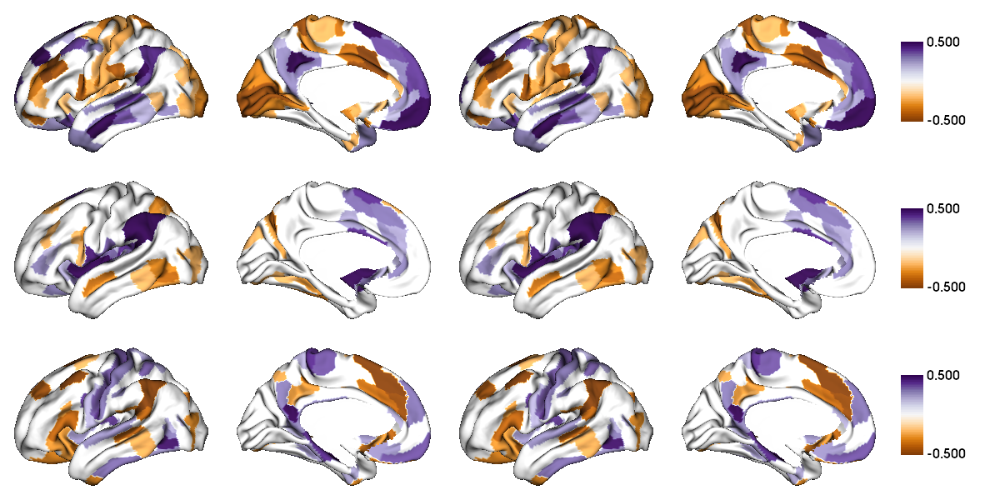

In [44]:
data = con_stat.T[0].T # cohen's d
grad = [None] * 3
mask = mmp_ll != 0
for i in range(3):
  grad[i] = map_to_labels(np.concatenate((data[i],data[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,600), cmap='PuOr', color_range=(-0.5, 0.5), 
                   filename='../figures/GSR/con_inter_cohen.png')

## Datasites

### Stats

In [45]:
inter_asd_g1 = sub_corr(path = '../results/GSR/grad/inter/', group = 'ASD', grad=0)
inter_con_g1 = sub_corr(path = '../results/GSR/grad/inter/', group = 'CONTROL', grad=0)
compare(inter_asd_g1, inter_con_g1, '../results/GSR/compare_t_p_inter_g1.csv')

every_site: [Ttest_indResult(statistic=-2.6194181270664307, pvalue=0.008879280281104322), Ttest_indResult(statistic=-3.5684466387477833, pvalue=0.0004078651151850136), Ttest_indResult(statistic=-5.152724641111919, pvalue=2.8666669327315905e-07), Ttest_indResult(statistic=-1.570002303140525, pvalue=0.1171158649518723), Ttest_indResult(statistic=-0.6444492937671591, pvalue=0.5199021645875967)] 
 total: Ttest_indResult(statistic=-6.98522977440661, pvalue=3.2485222129934424e-12)


separate: [[0.06568129335789538, 0.07480714626311606, 0.05001069739851515, 0.0635108520047141, 0.11807690775182166], [0.005680026129705422, 0.013066464030158906, 0.004003165199598495, 0.009228238120664797, 0.018786281536495995]] total: [0.061412387215898714, 0.0030630858698575516]


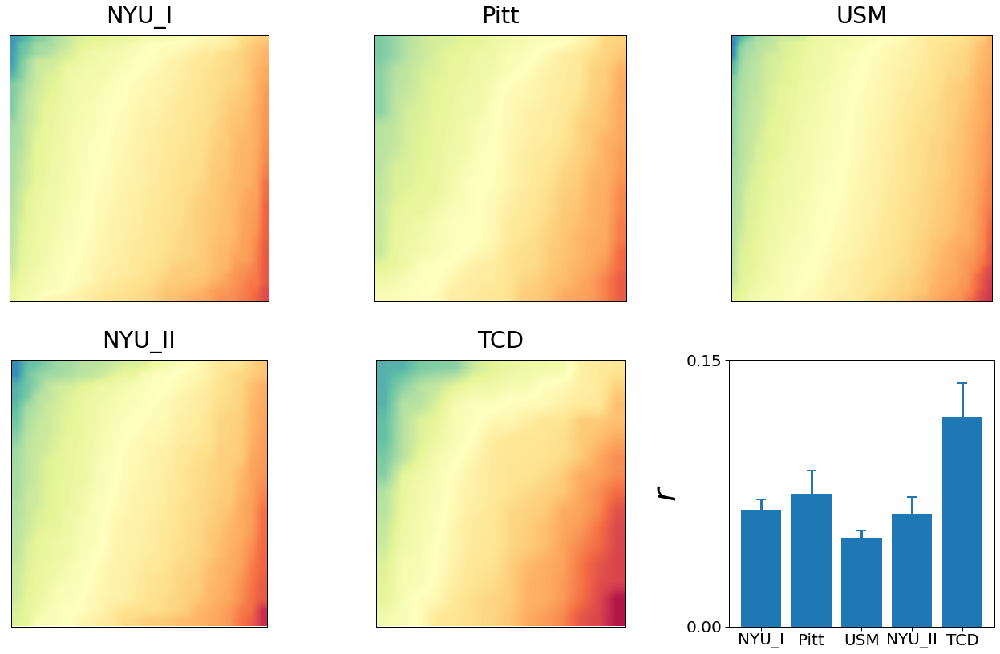

In [46]:
plot_corr_bar(inter_asd_g1, 'GSR_indi_asd_corr_inter_g1_site.png')

separate: [[0.07273870243013308, 0.11890788778909904, 0.08505686717586985, 0.09710273637409685, 0.1228673231264862], [0.0035306253391607497, 0.012152443441741354, 0.005247309542580949, 0.01356731461689107, 0.01552887400766851]] total: [0.08432055273308117, 0.0028389217128559348]


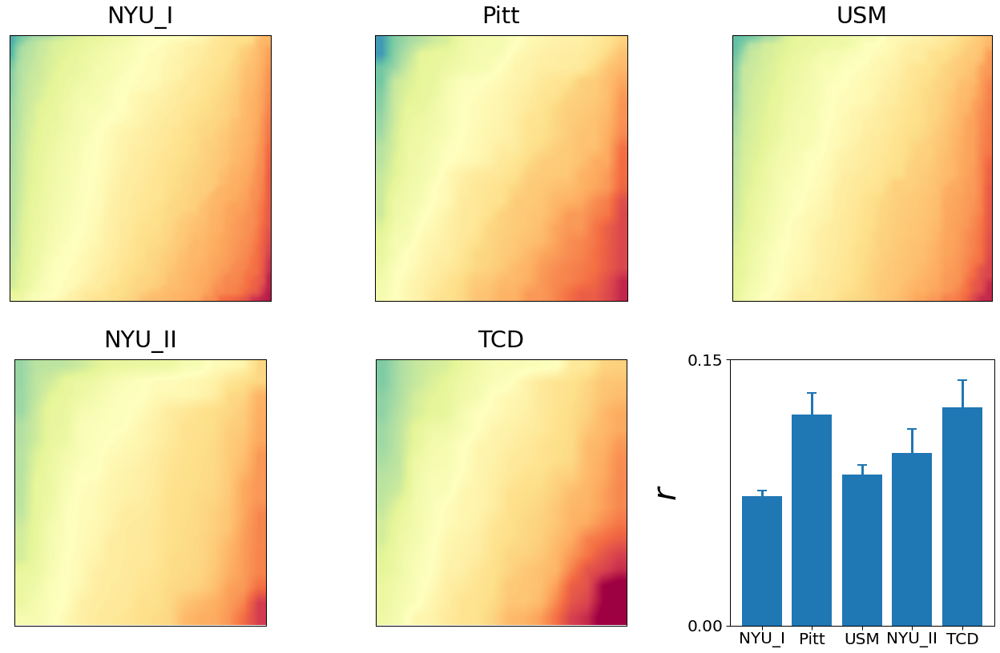

In [47]:
plot_corr_bar(inter_con_g1, 'GSR_indi_con_corr_inter_g1_site.png')

In [48]:
inter_asd_g2 = sub_corr(path = '../results/GSR/grad/inter/', group = 'ASD', grad=1)
inter_con_g2 = sub_corr(path = '../results/GSR/grad/inter/', group = 'CONTROL', grad=1)
compare(inter_asd_g2, inter_con_g2, '../results/GSR/compare_t_p_inter_g2.csv')

every_site: [Ttest_indResult(statistic=-0.9853430323875427, pvalue=0.3245832074243631), Ttest_indResult(statistic=-2.6663211589397493, pvalue=0.008015490311374192), Ttest_indResult(statistic=-1.641203941288134, pvalue=0.10094017289734408), Ttest_indResult(statistic=-3.0451992785421726, pvalue=0.0024614416397589025), Ttest_indResult(statistic=1.5520695263860544, pvalue=0.12196875034939525)] 
 total: Ttest_indResult(statistic=-2.8694959253492627, pvalue=0.004129911009667989)


separate: [[0.057279551969879695, 0.07275721810021914, 0.05065104646502629, 0.05244501048622468, 0.1249959911744899], [0.0055925673184016745, 0.012846937844704833, 0.004217393279072731, 0.00926230710732011, 0.018797879742147788]] total: [0.058109106060067674, 0.0031105223936628373]


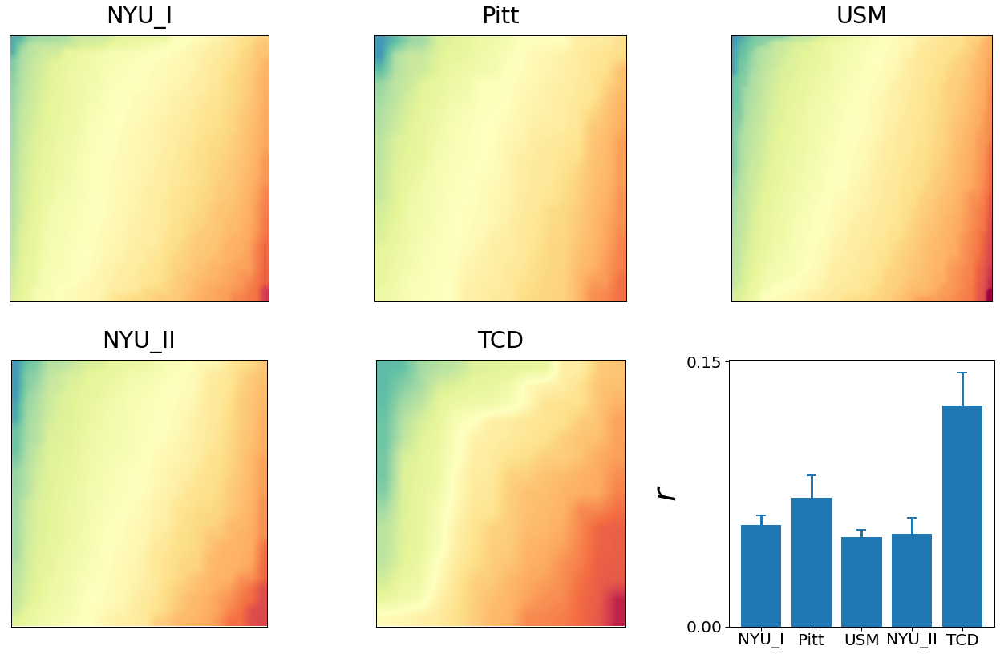

In [49]:
plot_corr_bar(inter_asd_g2, 'GSR_indi_asd_corr_inter_g2_site.png')

separate: [[0.05392694992593434, 0.1009007906524247, 0.06694015393988441, 0.10397467556247889, 0.08859090368226627], [0.0033984147218984522, 0.01182500249705316, 0.005805149585238234, 0.013715037210422743, 0.015771157209426366]] total: [0.06653741718010132, 0.0028764293518203352]


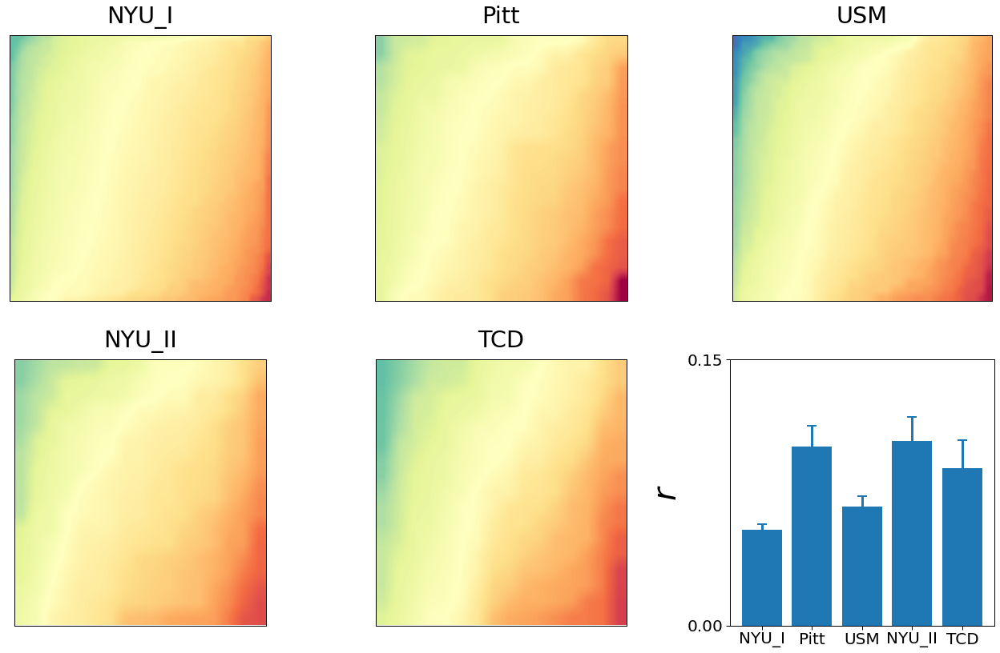

In [50]:
plot_corr_bar(inter_con_g2, 'GSR_indi_con_corr_inter_g2_site.png')

In [51]:
inter_asd_g3 = sub_corr(path = '../results/GSR/grad/inter/', group = 'ASD', grad=2)
inter_con_g3 = sub_corr(path = '../results/GSR/grad/inter/', group = 'CONTROL', grad=2)
compare(inter_asd_g3, inter_con_g3, '../results/GSR/compare_t_p_inter_g3.csv')

every_site: [Ttest_indResult(statistic=-3.59112125154107, pvalue=0.0003377674982361506), Ttest_indResult(statistic=-3.229537589818004, pvalue=0.0013543074038623324), Ttest_indResult(statistic=-7.010948721581383, pvalue=3.4027665126931096e-12), Ttest_indResult(statistic=-0.8177633560791032, pvalue=0.4139241412573743), Ttest_indResult(statistic=1.819158583399264, pvalue=0.0701385433015609)] 
 total: Ttest_indResult(statistic=-7.8548412582391185, pvalue=4.941013913628889e-15)


separate: [[0.05994677146541333, 0.07679445317167075, 0.04139537350984507, 0.07117728233131702, 0.1368529271229909], [0.0054130406131308, 0.012609018686900328, 0.0037715579153881815, 0.00868807087006432, 0.017043725181652085]] total: [0.05800261710164382, 0.0029027880532880895]


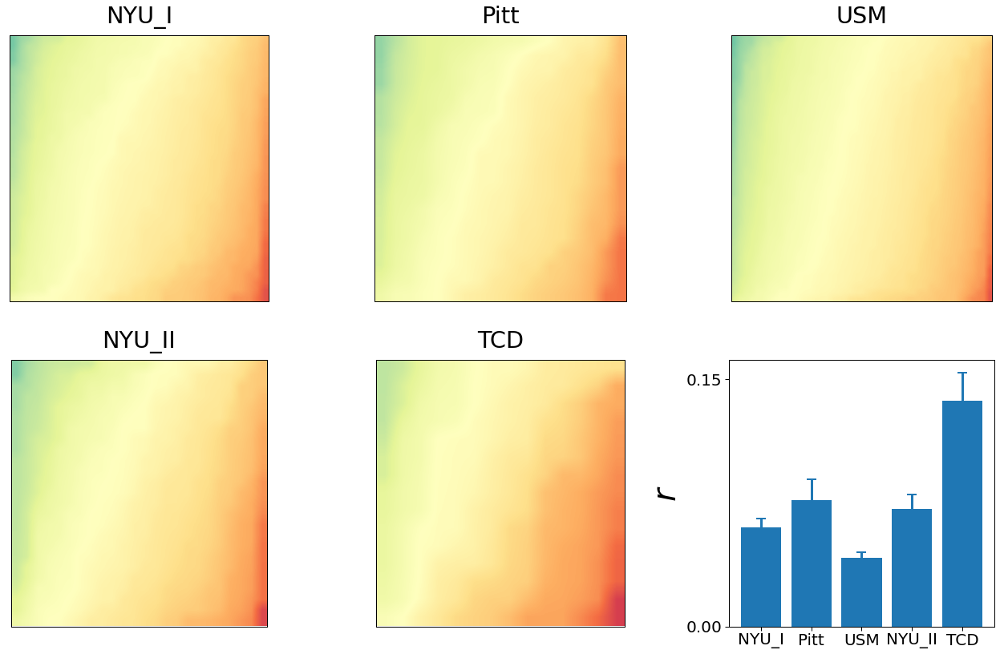

In [52]:
plot_corr_bar(inter_asd_g3, 'GSR_indi_asd_corr_inter_g3_site.png')

separate: [[0.06875462943404369, 0.10779071987075195, 0.08207567721899552, 0.09446759508361054, 0.10466562708056212], [0.0032261848100383086, 0.011449568643581782, 0.005108934782552565, 0.013495225353699035, 0.014631765713650635]] total: [0.07930253828063928, 0.0026773648448744332]


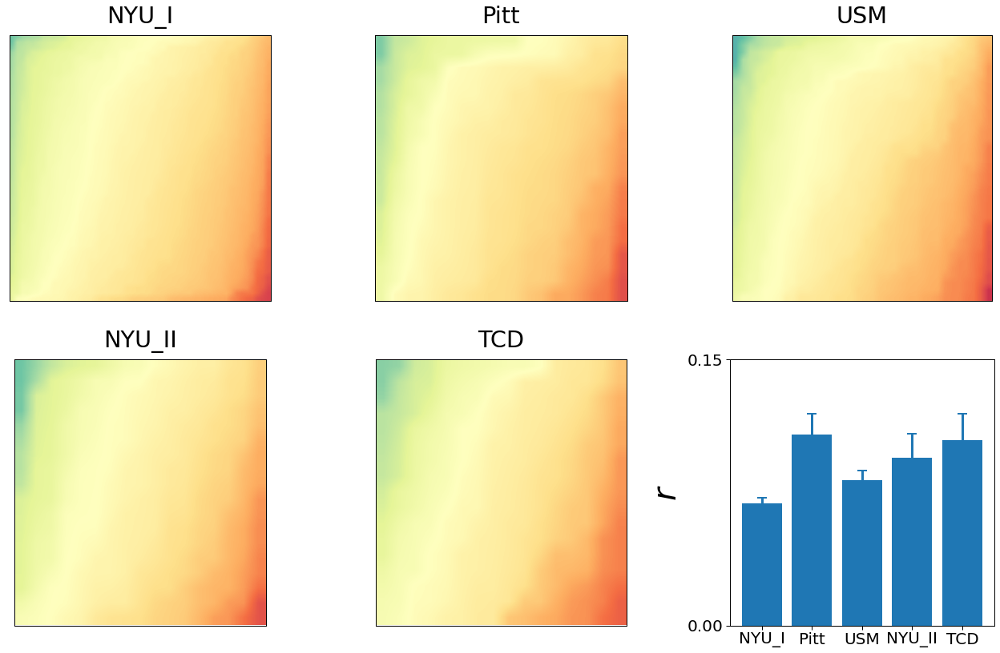

In [53]:
plot_corr_bar(inter_con_g3, 'GSR_indi_con_corr_inter_g3_site.png')

# Effects of DX group

## load phenotype data

In [54]:
group = np.array(phen['group'])
group[group=='ASD'] = 1.
group[group=='CONTROL'] = 2.
site = np.array(phen['site'])
site[site=='NYU'] = 1.
site[site=='Pitt'] = 2.
site[site=='USM'] = 3.
site[site=='NYU_II'] = 4.
site[site=='TCD'] = 5.
#age = np.array(phen['age'])
#age[age>17.99999] = 1
#age[age>11.99999] = 2
#age[age>5.99999] = 3
phen['group'] = group
phen['site'] = site
#phen['age'] =age
phen['group'] = pd.to_numeric(phen['group'])
phen['site'] = pd.to_numeric(phen['site'])
#phen['age'] = pd.to_numeric(phen['age'])
phen

,ID,group,site,age,FIQ,ados_comm,ados_social,ados_rrb,meanFD
0,29096,1.0,5.0,15.50,98,2,5,0,0.165400
1,29099,1.0,5.0,10.75,123,3,5,0,0.148400
2,29101,1.0,5.0,14.00,103,3,4,0,0.248200
3,29103,1.0,5.0,14.75,108,4,3,0,0.161700
4,29104,1.0,5.0,19.25,119,3,13,1,0.066200
...,...,...,...,...,...,...,...,...,...
278,32641,1.0,3.0,18.25,106,4,9,1,0.175961
279,32643,1.0,3.0,16.92,84,1,11,0,0.122636
280,32646,1.0,3.0,20.17,108,3,5,0,0.062141
281,32647,1.0,3.0,32.55,126,4,6,0,0.121629


In [55]:
cov = phen[['site', 'age']]
cov

,site,age
0,5.0,15.50
1,5.0,10.75
2,5.0,14.00
3,5.0,14.75
4,5.0,19.25
...,...,...
278,3.0,18.25
279,3.0,16.92
280,3.0,20.17
281,3.0,32.55


In [56]:
group = FixedEffect(phen['group'], 'group')

In [57]:
model = group
model

,intercept,group
0,1,1.0
1,1,1.0
2,1,1.0
3,1,1.0
4,1,1.0
...,...,...
278,1,1.0
279,1,1.0
280,1,1.0
281,1,1.0


## Intra

In [58]:
path = '../results/GSR/grad/intra/'
sub = phen['ID']
n = len(sub)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [59]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g3 = np.array(matrix).T[2].T
matrix_g1.shape

(283, 180)

In [60]:
matrix_g1 = harmony(matrix_g1)
matrix_g2 = harmony(matrix_g2)
matrix_g3 = harmony(matrix_g3)

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [61]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [62]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [63]:
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(),t_g3.min(),t_g3.max(),t_g123.min(),t_g123.max()

(-4.140133937751591,
 3.6776038232019164,
 -2.8877578190607647,
 2.695832358776855,
 -3.001355817921882,
 2.601955787128501,
 0.16071441393993802,
 4.399131427297038)

In [64]:
p_g1.min(), p_g2.min(), p_g3.min(), p_g123.min()

(4.5936768328266354e-05,
 0.004181594349883885,
 0.0029292197395905375,
 7.721777259156096e-06)

In [65]:
fdr(p_g1).min(), fdr(p_g2).min(),fdr(p_g3).min(), fdr(p_g123).min()

(0.008268618299087944,
 0.5315808781631904,
 0.5272595531262968,
 0.0013899199066480974)

In [66]:
a = fdr(p_g123)
thres=0.05/3
a[a>0.05]=1
p_g1[np.logical_or(p_g1>thres,a==1)]= 1
p_g2[np.logical_or(p_g2>thres,a==1)] = 1
p_g3[np.logical_or(p_g3>thres,a==1)] = 1
np.savetxt('../results/GSR/asdVScon_t_p_g1g2g3_pdfr123_intra.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [67]:
t_g1[np.logical_or(p_g1>thres,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>thres,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>thres,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

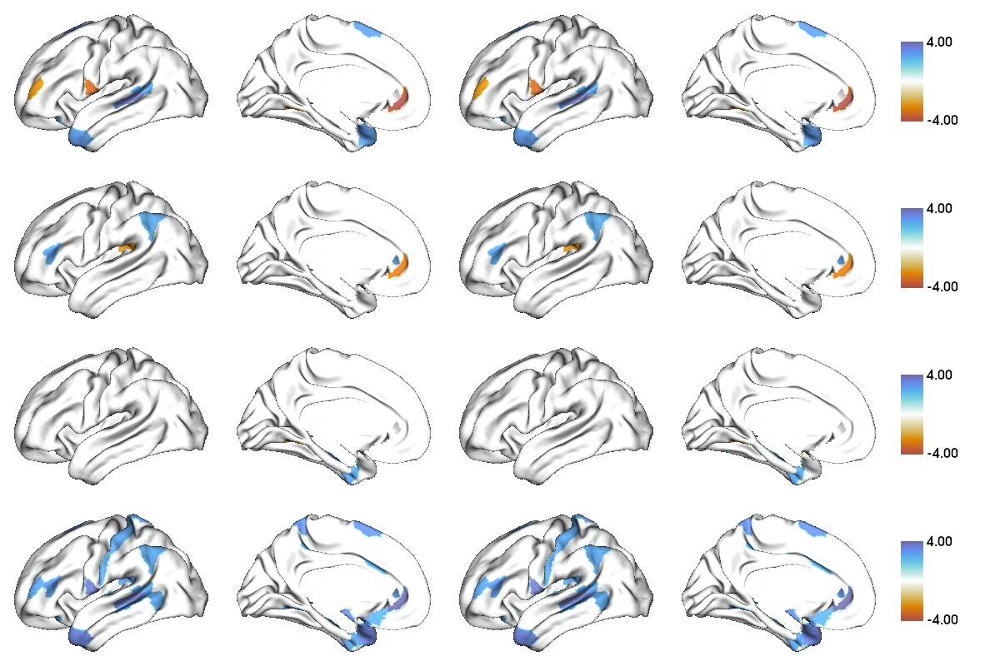

In [68]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/GSR/control_asd_t_intra.png')

### network-wise

In [69]:
path = '../results/GSR/grad/network/intra/'

n = len(sub)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [70]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g3 = np.array(matrix).T[2].T
matrix_g1 = harmony(matrix_g1)
matrix_g2 = harmony(matrix_g2)
matrix_g3 = harmony(matrix_g3)

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [71]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [72]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)  

In [73]:
t_g1, t_g2, t_g3, t_g123

(array([-0.82318617, -0.27293183, -1.00244468, -0.89195229, -0.1079917 ,
         3.95447266, -0.46893264, -1.58133172,  0.21961353,  1.29485875,
        -1.04976869, -0.64489928]),
 array([ 0.75381729,  0.4705458 , -0.46822646, -0.08491201, -1.08326108,
         2.45021129, -0.66920556, -0.49199889, -0.2646111 , -0.13606965,
         0.13098086,  0.33304009]),
 array([-1.11207968, -0.29373164,  2.09112903, -1.27578799,  1.27526153,
        -0.75237053,  0.56184089, -0.76462534, -0.19816654, -1.5093807 ,
         2.63524477, -0.87476201]),
 array([1.27130254, 0.49795142, 2.5047567 , 1.46949827, 1.71717672,
        4.09486244, 0.98798768, 1.87607912, 0.4067788 , 1.71793859,
        2.65705331, 1.42338959]))

In [74]:
p_g1, p_g2, p_g3, p_g123

(array([4.11100186e-01, 7.85106092e-01, 3.16991309e-01, 3.73181652e-01,
        9.14079343e-01, 9.71504360e-05, 6.39481382e-01, 1.14927102e-01,
        8.26331604e-01, 1.96431878e-01, 2.94726470e-01, 5.19518608e-01]),
 array([0.45159012, 0.63833015, 0.63998563, 0.93239181, 0.27962118,
        0.01488727, 0.5039138 , 0.62310426, 0.79150305, 0.89186365,
        0.89588417, 0.73935237]),
 array([0.26705441, 0.76917981, 0.03741455, 0.20308406, 0.20327001,
        0.45245804, 0.57467228, 0.44513631, 0.84305805, 0.13232509,
        0.00887445, 0.38245046]),
 array([1.02336171e-01, 3.09453878e-01, 6.40998786e-03, 7.14081859e-02,
        4.35243540e-02, 2.76400785e-05, 1.62004316e-01, 3.08404627e-02,
        3.42240056e-01, 4.34547083e-02, 4.16682804e-03, 7.78662922e-02]))

In [75]:
fdr(p_g1), fdr(p_g2),fdr(p_g3), fdr(p_g123)

(array([0.70474318, 0.94212731, 0.76077914, 0.7463633 , 0.91407934,
        0.00116581, 0.85264184, 0.68956261, 0.90145266, 0.78572751,
        0.88417941, 0.77927791]),
 array([1.        , 1.        , 1.        , 0.93239181, 1.        ,
        0.17864722, 1.        , 1.        , 1.        , 1.        ,
        0.97732819, 1.        ]),
 array([0.53410883, 0.83910524, 0.22448731, 0.60925218, 0.48784802,
        0.60327738, 0.68960674, 0.66770446, 0.84305805, 0.52930037,
        0.10649342, 0.65562935]),
 array([1.36448228e-01, 3.37586049e-01, 2.56399514e-02, 1.22414033e-01,
        8.70487081e-02, 3.31680942e-04, 1.94405179e-01, 9.25213881e-02,
        3.42240056e-01, 1.04291300e-01, 2.50009682e-02, 1.16799438e-01]))

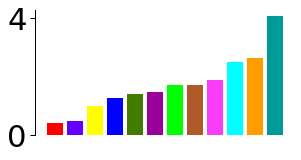

In [76]:
fu.plot_t_single(t_g123, '../figures/GSR/ca_asd_con_intra_multiT.png')

In [77]:
p_g1[p_g1>thres] = 1
p_g2[p_g2>thres] = 1
p_g3[p_g3>thres] = 1
a = fdr(p_g123)
a[a>0.05]=1
np.savetxt('../results/GSR/ca_asdVScon_t_p_g1g2g3_pdfr123_intra.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

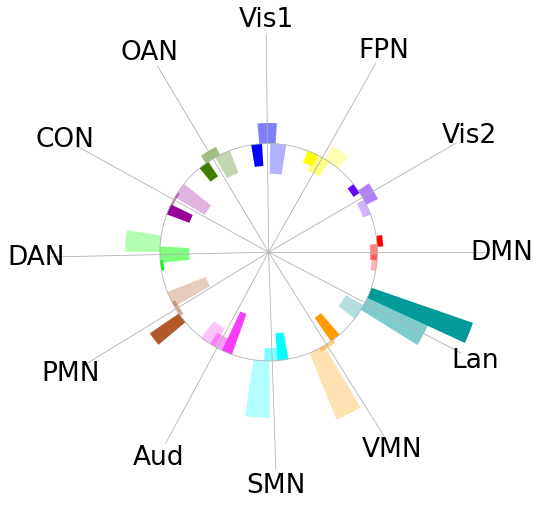

In [78]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/GSR/ca_intra_t_g123.png')

## Inter

In [79]:
path = '../results/GSR/grad/inter/'
n = len(sub)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [80]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g1 = harmony(matrix_g1)
matrix_g2 = harmony(matrix_g2)
matrix_g3 = np.array(matrix).T[2].T
matrix_g3 = harmony(matrix_g3)

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [81]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [82]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(), t_g3.min(),t_g3.max(), t_g123.min(), t_g123.max()

(-3.9492613852356904,
 3.300920772921008,
 -2.431539198487708,
 2.4807230888408736,
 -2.9393801380899935,
 3.663858178550136,
 0.07219294489115731,
 4.979866451821786)

In [83]:
[p_g1.min(), fdr(p_g1).min(), p_g2.min(), fdr(p_g2).min(),
p_g3.min(), fdr(p_g3).min(), p_g123.min(), fdr(p_g123).min()]

[9.917532788045592e-05,
 0.016677671974002353,
 0.013697136190925953,
 0.9266650318210989,
 0.00029689945340318695,
 0.05344190161257365,
 5.561602875817937e-07,
 0.00010010885176472287]

In [84]:
a = fdr(p_g123)
a[a>0.05]=1
p_g1[np.logical_or(p_g1>thres,a==1)]  = 1
p_g2[np.logical_or(p_g2>thres,a==1)]  = 1
p_g3[np.logical_or(p_g3>thres,a==1)] = 1
np.savetxt('../results/GSR/asdVScon_t_p_g1g2g3_pdfr123_inter.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [85]:
a = fdr(p_g123)
a[a>0.05]=1
t_g1[np.logical_or(p_g1>thres,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>thres,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>thres,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

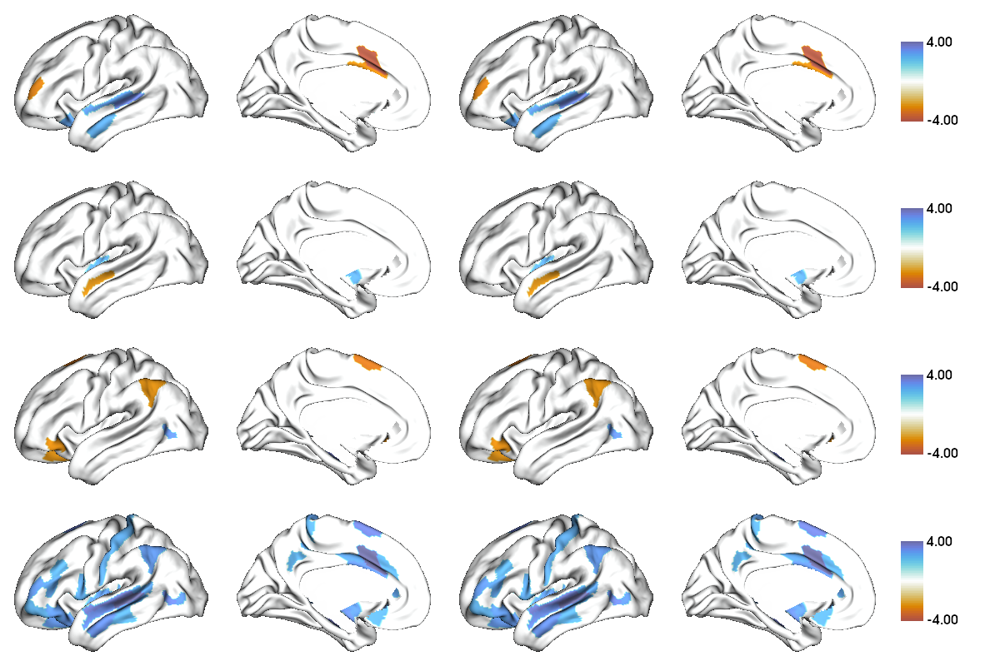

In [86]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/GSR/control_asd_t_inter.png')

#### network-wise

In [87]:
path = '../results/GSR/grad/network/inter/'
n = len(sub)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

In [88]:
matrix_g1 = np.array(matrix).T[0].T
matrix_g2 = np.array(matrix).T[1].T
matrix_g3 = np.array(matrix).T[2].T

In [89]:
slm_g1 = SLM(model, contrast=model.group)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.group)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.group)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.group)
slm_g123.fit(np.array([matrix_g1.T, matrix_g2.T, matrix_g3.T]).T)

In [90]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof) 

In [91]:
t_g1, t_g2, t_g3, t_g123

(array([-1.52225353, -1.33259522, -1.05669878, -2.60476846, -0.88790851,
         3.88910175, -0.63089673, -0.18833626,  1.83705414,  1.12444933,
        -0.79064259, -0.52127784]),
 array([ 0.42951437, -0.16313364, -0.13698685,  1.51222777, -1.1496478 ,
         0.68461832, -0.59268697,  0.60668189, -1.00406532,  0.35635871,
        -0.0464214 ,  1.38050448]),
 array([-0.29892458,  1.16250396,  3.09217519, -1.80329179,  1.35912081,
        -2.02921057, -0.41028246, -0.12816476, -0.18995669, -0.70444382,
         1.47396949, -0.75641151]),
 array([1.56651634, 2.12660527, 3.2837464 , 3.31220465, 2.09957439,
        4.18400503, 0.90152369, 0.76317536, 2.27021083, 1.23329909,
        1.55916306, 2.06883668]))

In [92]:
p_g1, p_g2, p_g3, p_g123

(array([1.29070080e-01, 1.83744247e-01, 2.91556688e-01, 9.68297477e-03,
        3.75349334e-01, 1.25644852e-04, 5.28620845e-01, 8.50749001e-01,
        6.72578811e-02, 2.61782067e-01, 4.29819350e-01, 6.02583805e-01]),
 array([0.66787809, 0.87053047, 0.89113929, 0.13159973, 0.25126649,
        0.49414908, 0.55386732, 0.54455188, 0.31621096, 0.72183936,
        0.96300736, 0.1685285 ]),
 array([0.76521855, 0.24601716, 0.00218672, 0.0724135 , 0.17519811,
        0.04337931, 0.6819114 , 0.89811026, 0.84948021, 0.48173983,
        0.14160918, 0.45003619]),
 array([5.91765949e-02, 1.71621368e-02, 5.77027484e-04, 5.23404445e-04,
        1.83290367e-02, 1.91664072e-05, 1.84040995e-01, 2.22999526e-01,
        1.19760476e-02, 1.09247431e-01, 6.00416495e-02, 1.97378975e-02]))

In [93]:
fdr(p_g1), fdr(p_g2), fdr(p_g3), fdr(p_g123)

(array([0.38721024, 0.44098619, 0.49981146, 0.05809785, 0.563024  ,
        0.00150774, 0.63434501, 0.850749  , 0.26903152, 0.52356413,
        0.57309247, 0.65736415]),
 array([1.        , 1.        , 0.97215195, 1.        , 1.        ,
        1.        , 0.94948683, 1.        , 0.94863287, 0.96245249,
        0.96300736, 1.        ]),
 array([0.91826225, 0.49203431, 0.02624068, 0.28965402, 0.42047545,
        0.26027585, 0.9092152 , 0.89811026, 0.92670569, 0.72260974,
        0.42482754, 0.77149062]),
 array([0.08876489, 0.04118913, 0.00230811, 0.00314043, 0.03665807,
        0.00023   , 0.20077199, 0.22299953, 0.03592814, 0.13109692,
        0.08005553, 0.0338364 ]))

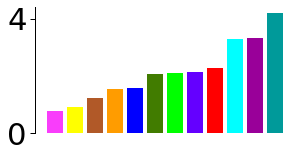

In [94]:
fu.plot_t_single(t_g123, '../figures/GSR/ca_asd_con_inter_multiT.png')

In [95]:
a = fdr(p_g123)
a[a>0.05]=1
p_g1[p_g1>thres] = 1
p_g2[p_g2>thres] = 1
p_g3[p_g3>thres] = 1
np.savetxt('../results/GSR/ca_asdVScon_t_p_g1g2g3_pdfr123_inter.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

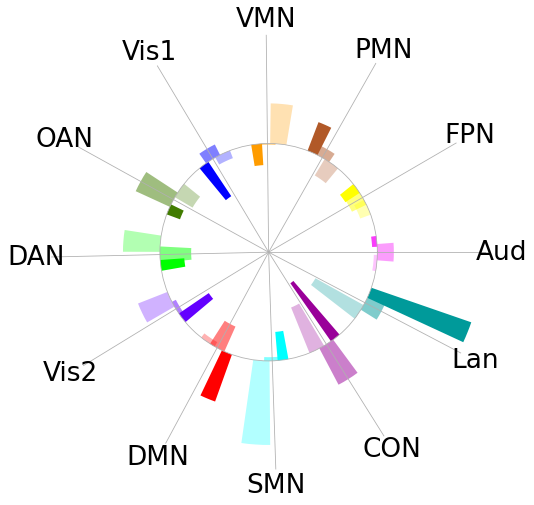

In [96]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/GSR/ca_inter_t_g123.png')

## correlation with HCP

In [97]:
data = [np.genfromtxt('../results/GSR/con_stat_intra_cohen_pfdr.csv')[:,:3],
        np.genfromtxt('../results/GSR/asd_stat_intra_cohen_pfdr.csv')[:,:3],
        np.genfromtxt('../results/GSR/con_stat_inter_cohen_pfdr.csv')[:,:3],
        np.genfromtxt('../results/GSR/asd_stat_inter_cohen_pfdr.csv')[:,:3]]

In [98]:
[ss.pearsonr(data[0][:,0], hcp_cohen[0]),
 ss.pearsonr(data[0][:,1], hcp_cohen[1]),
 ss.pearsonr(data[0][:,2], hcp_cohen[2]),
 ss.pearsonr(data[1][:,0], hcp_cohen[0]),
 ss.pearsonr(data[1][:,1], hcp_cohen[1]),
 ss.pearsonr(data[1][:,2], hcp_cohen[2]),
 ss.pearsonr(data[2][:,0], hcp_cohen[3]),
 ss.pearsonr(data[2][:,1], hcp_cohen[4]),
 ss.pearsonr(data[2][:,2], hcp_cohen[5]),
 ss.pearsonr(data[3][:,0], hcp_cohen[3]),
 ss.pearsonr(data[3][:,1], hcp_cohen[4]),
 ss.pearsonr(data[3][:,2], hcp_cohen[5])]

[(0.7118041376925446, 4.083779163953623e-29),
 (0.5270337196976597, 2.955502368545927e-14),
 (0.7550917293591021, 1.8210045498993576e-34),
 (0.5824070081352097, 9.83257130031647e-18),
 (0.46372629861589415, 5.530716579464325e-11),
 (0.6463443300441681, 1.1385993232988338e-22),
 (0.5079000653011118, 3.400621508461602e-13),
 (0.38319442211607757, 1.1001729515084882e-07),
 (0.7025266057920597, 4.278155662834281e-28),
 (0.5345409782598163, 1.086017233240869e-14),
 (0.3852873441390256, 9.25368727512689e-08),
 (0.6020403842086203, 3.9260647581626393e-19)]

In [99]:
spin_con_asd_intra_g1 = fu.spin_pearson_pair(hcp_cohen[0], data[0][:,0], data[1][:,0])
spin_con_asd_intra_g2 = fu.spin_pearson_pair(hcp_cohen[1], data[0][:,1], data[1][:,1])
spin_con_asd_intra_g3 = fu.spin_pearson_pair(hcp_cohen[2], data[0][:,2], data[1][:,2])
spin_con_asd_inter_g1 = fu.spin_pearson_pair(hcp_cohen[3], data[2][:,0], data[3][:,0])
spin_con_asd_inter_g2 = fu.spin_pearson_pair(hcp_cohen[4], data[2][:,1], data[3][:,1])
spin_con_asd_inter_g3 = fu.spin_pearson_pair(hcp_cohen[5], data[2][:,2], data[3][:,2])
[spin_con_asd_intra_g1.spin_p1, spin_con_asd_intra_g1.spin_p2,
 spin_con_asd_intra_g2.spin_p1, spin_con_asd_intra_g2.spin_p2,
 spin_con_asd_intra_g3.spin_p1, spin_con_asd_intra_g3.spin_p2,
 spin_con_asd_inter_g1.spin_p1, spin_con_asd_inter_g1.spin_p2,
 spin_con_asd_inter_g2.spin_p1, spin_con_asd_inter_g2.spin_p2,
 spin_con_asd_inter_g3.spin_p1, spin_con_asd_inter_g3.spin_p2]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.009, 0.001, 0.0, 0.0]

In [100]:
res = fu.res
[res(hcp_cohen[0], data[0][:,0]),
 res(hcp_cohen[1], data[0][:,1]),
 res(hcp_cohen[2], data[0][:,2]),
 res(hcp_cohen[0], data[1][:,0]),
 res(hcp_cohen[1], data[1][:,1]),
 res(hcp_cohen[2], data[1][:,2]),
 res(hcp_cohen[3], data[2][:,0]),
 res(hcp_cohen[4], data[2][:,1]),
 res(hcp_cohen[5], data[2][:,2]),
 res(hcp_cohen[3], data[3][:,0]),
 res(hcp_cohen[4], data[3][:,1]),
 res(hcp_cohen[5], data[3][:,2])]

[BootstrapResult(confidence_interval=ConfidenceInterval(low=0.6208095957144024, high=0.7843485586023271), standard_error=0.04205573834318276),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.3877533704873995, high=0.6387447275209198), standard_error=0.06307044100734355),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.6881954848833686, high=0.8068684932199222), standard_error=0.030226417929911487),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.45992857656460473, high=0.6914798805238884), standard_error=0.05905811291152033),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.335533948592703, high=0.5789224904483172), standard_error=0.06204457433954208),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.5536258043623825, high=0.7230244762958858), standard_error=0.04297448634169157),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.39625271058665457, high=0.6138771077723683), standard_error=0.05643541068237347

# AGE effects

## phen

In [101]:
phen['age'][phen['age']>18] = 3
phen['age'][phen['age']>12] = 2
phen['age'][phen['age']>4] = 1
phen['group'][phen['group']==2]=-1
phen

,ID,group,site,age,FIQ,ados_comm,ados_social,ados_rrb,meanFD
0,29096,1.0,5.0,2.0,98,2,5,0,0.165400
1,29099,1.0,5.0,1.0,123,3,5,0,0.148400
2,29101,1.0,5.0,2.0,103,3,4,0,0.248200
3,29103,1.0,5.0,2.0,108,4,3,0,0.161700
4,29104,1.0,5.0,3.0,119,3,13,1,0.066200
...,...,...,...,...,...,...,...,...,...
278,32641,1.0,3.0,3.0,106,4,9,1,0.175961
279,32643,1.0,3.0,2.0,84,1,11,0,0.122636
280,32646,1.0,3.0,3.0,108,3,5,0,0.062141
281,32647,1.0,3.0,3.0,126,4,6,0,0.121629


In [102]:
# control_adult,adol,kid and asd_adult,adol,kid
age_dx = [np.array(phen[phen['group']==-1][phen['age']==3].index),
          np.array(phen[phen['group']==-1][phen['age']==2].index),
          np.array(phen[phen['group']==-1][phen['age']==1].index),
          np.array(phen[phen['group']==1][phen['age']==3].index),
          np.array(phen[phen['group']==1][phen['age']==2].index),
          np.array(phen[phen['group']==1][phen['age']==1].index)]
[len(age_dx[i]) for i in range(6)]

[65, 46, 32, 60, 43, 37]

In [103]:
def harmony(data):
    data_combat = neuroCombat(dat=data.T, mean_only= True,
                              covars=cov,
                              batch_col='site')['data']
    return data_combat.T

In [104]:
cov = pd.DataFrame(phen['site'])
cov

,site
0,5.0
1,5.0
2,5.0
3,5.0
4,5.0
...,...
278,3.0
279,3.0
280,3.0
281,3.0


In [105]:
group = FixedEffect(phen['group'], 'group')
age = FixedEffect(phen['age'], 'age')
interact = FixedEffect(phen['group']*phen['age'], 'interact')
model = group + age + interact
model

,intercept,group,age,interact
0,1,1.0,2.0,2.0
1,1,1.0,1.0,1.0
2,1,1.0,2.0,2.0
3,1,1.0,2.0,2.0
4,1,1.0,3.0,3.0
...,...,...,...,...
278,1,1.0,3.0,3.0
279,1,1.0,2.0,2.0
280,1,1.0,3.0,3.0
281,1,1.0,3.0,3.0


## intra

### stats

In [106]:
path = '../results/GSR/grad/intra/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n

for i in range(n):
  matrix[i] = np.array(pd.read_csv(path+str(list(sub)[i])+'.csv',header=None))[:,:3]

matrix = np.array(matrix).T
matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [107]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T)

In [108]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [109]:
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(),t_g3.min(),t_g3.max(),t_g123.min(),t_g123.max()

(-2.5776029063038477,
 2.2542104567592185,
 -3.503731088410856,
 4.425632168733211,
 -3.021075075356579,
 2.8825301582585596,
 0.24390372191621335,
 4.832664572453255)

In [110]:
p_g1.min(), p_g2.min(), p_g3.min(), p_g123.min()

(0.010462350938470175,
 1.3807084084698e-05,
 0.002752380686656442,
 1.113455723588385e-06)

In [111]:
fdr(p_g1).min(), fdr(p_g2).min(),fdr(p_g3).min(),fdr(p_g123).min()

(0.9326717304184725,
 0.00248527513524564,
 0.3379226138634516,
 0.0002004220302459093)

In [112]:
a = fdr(p_g123)
a[a>0.05]=1
p_g1[np.logical_or(p_g1>thres,a==1)]= 1
p_g2[np.logical_or(p_g2>thres,a==1)] = 1
p_g3[np.logical_or(p_g3>thres,a==1)] = 1
np.savetxt('../results/GSR/interact_t_p_g1g2g3_pdfr123_intra.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [113]:
t_g1[np.logical_or(p_g1>thres,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>thres,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>thres,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

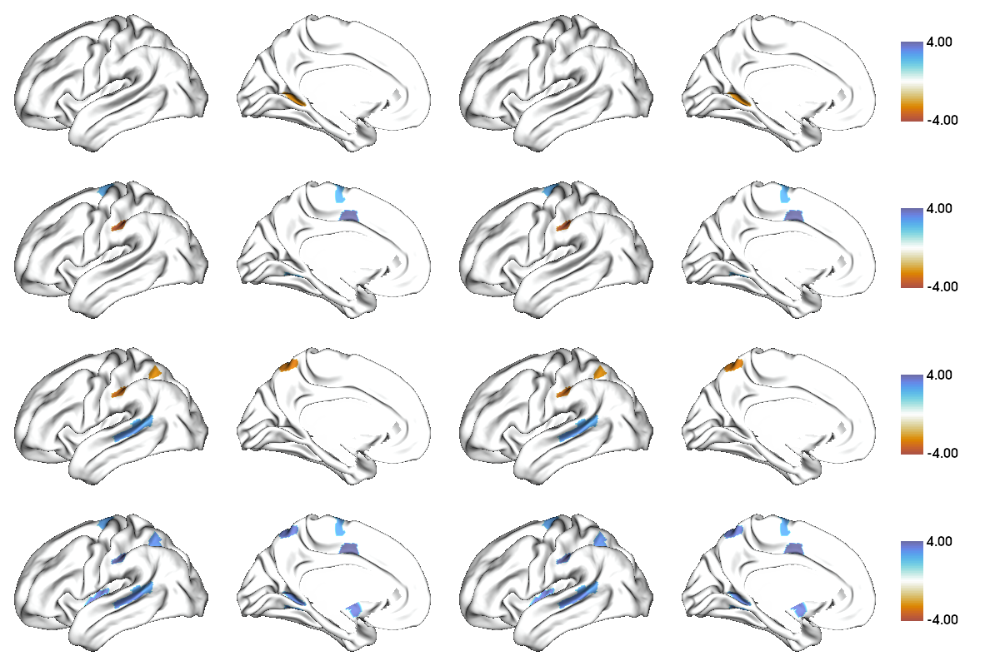

In [114]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/GSR/interact_t_intra.png')

In [115]:
mean = np.zeros((6,180,3))
sd = np.zeros((6,180,3))
ste = np.zeros((6,180,3))
for j in range(6):
  for i in range(180):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()
      ste[j,i,n] = se(matrix_total[age_dx[j]][:,i][:,n])

In [116]:
def t_pfdr(num_1, num_2, node, ga, filename): # ga: 'group' or 'age'
  contrast = phen[ga][np.concatenate((age_dx[num_1], age_dx[num_2]))]
  model = FixedEffect(phen[ga][np.concatenate((age_dx[num_1], age_dx[num_2]))], ga)
  slm_g1 = SLM(model, contrast=contrast)
  slm_g1.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))].T[0].T)
  slm_g2 = SLM(model, contrast=contrast)
  slm_g2.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))].T[1].T)
  slm_g3 = SLM(model, contrast=contrast)
  slm_g3.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))].T[2].T)
  slm_g123 = SLM(model, contrast=contrast)
  slm_g123.fit(matrix_total[np.concatenate((age_dx[num_1], age_dx[num_2]))])
  t_g1 = slm_g1.t[0]
  t_g2 = slm_g2.t[0]
  t_g3 = slm_g3.t[0]
  p_g1 = np.zeros(node)
  p_g2 = np.zeros(node)
  p_g3 = np.zeros(node)
  t_g123 = slm_g123.t[0]
  p_g123 = np.zeros(node)
  dof = model.shape[0] - model.shape[1] # degree of freedom
  for i in range(node):
    # p-value for one-sided test two-side = *2, multivariates just one side
    p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
    p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
    p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
    p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

  p_g1[p_g1>thres] = 1
  p_g2[p_g2>thres] = 1
  p_g3[p_g3>thres] = 1
  a = fdr(p_g123)
  a[a>0.05]=1
  np.savetxt('../results/GSR/'+filename+'_t_p_g1g2g3_pdfr123.csv', 
             np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)
  return print('Finish saving ' + filename)

In [117]:
t_pfdr(0, 3, 180, 'group', 'intra_adult_con_asd')
t_pfdr(1, 4, 180, 'group', 'intra_adol_con_asd')
t_pfdr(2, 5, 180, 'group', 'intra_kid_con_asd')
t_pfdr(0, 1, 180, 'age', 'intra_con_adult_adol')
t_pfdr(0, 2, 180, 'age', 'intra_con_adult_kid')
t_pfdr(1, 2, 180, 'age', 'intra_con_adol_kid')
t_pfdr(3, 4, 180, 'age', 'intra_asd_adult_adol')
t_pfdr(3, 5, 180, 'age', 'intra_asd_adult_kid')
t_pfdr(4, 5, 180, 'age', 'intra_asd_adol_kid')

Finish saving intra_adult_con_asd
Finish saving intra_adol_con_asd
Finish saving intra_kid_con_asd
Finish saving intra_con_adult_adol
Finish saving intra_con_adult_kid
Finish saving intra_con_adol_kid
Finish saving intra_asd_adult_adol
Finish saving intra_asd_adult_kid
Finish saving intra_asd_adol_kid


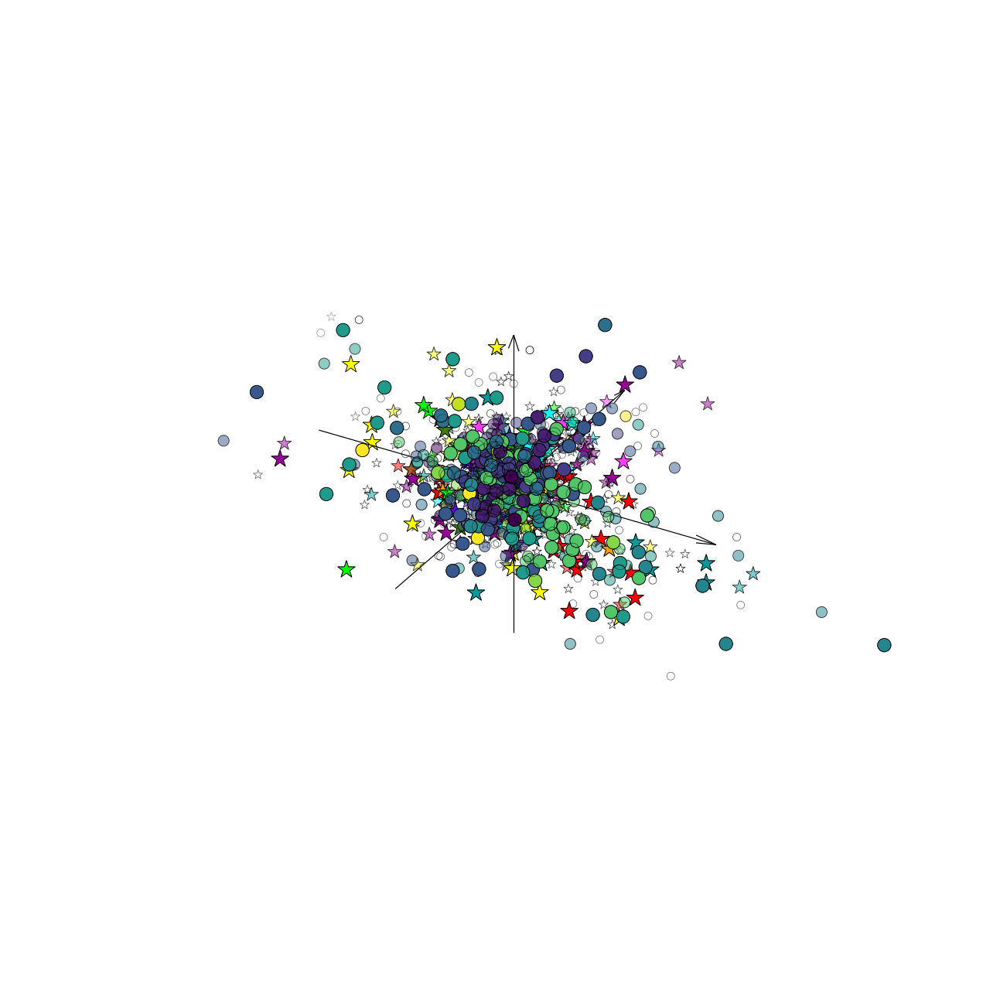

In [118]:
title = ['Control adults', 'ASD adults',
         'Control adolescents','ASD adolescents', 
         'Controls children', 'ASD children']
#mean = [mean[0], mean[3], mean[1], mean[4], mean[2], mean[5]]
sns.set_context("paper", font_scale = 0.8)
fig = plt.figure(figsize=(18,18))
m = [1,1,2,2,3,3]
j = [1,2,1,2,1,2]
ax = fig.add_subplot(projection='3d')
ax.set_xlim(-0.04, 0.04)
ax.set_ylim(-0.04, 0.04)
ax.set_zlim(-0.04, 0.04)
ax.set_xticks(np.arange(-0.04,0.04,0.02))
ax.set_yticks(np.arange(-0.04,0.04,0.02))
ax.set_zticks(np.arange(-0.04,0.04,0.02))
ax._axis3don = False
x, y, z = np.array([[-0.03,0,0],[0,-0.03,0],[0,0,-0.03]])
u, v, w = np.array([[0.06,0,0],[0,0.06,0],[0,0,0.06]])
ax.quiver(x,y,z,u,v,w,arrow_length_ratio=0.05, color="black")
ax.grid(False)
for i in range(3):
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-100*i, c = color, marker = 'o', alpha=1-0.5*i)
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-200*i, c = color, cmap=cmap, marker = '*', alpha=1-0.5*i)
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-100*i, c = [0,0,0,0], marker = 'o')
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-200*i, c = [0,0,0,0], cmap=cmap, marker = '*')
#ax.set_title(title[i], y = 1.0, pad=-110, fontsize=30)
plt.tight_layout()
plt.savefig('../figures/GSR/age_dx_mean_intra_3d.png', dpi=300, transparent=True)

### parcel-wise

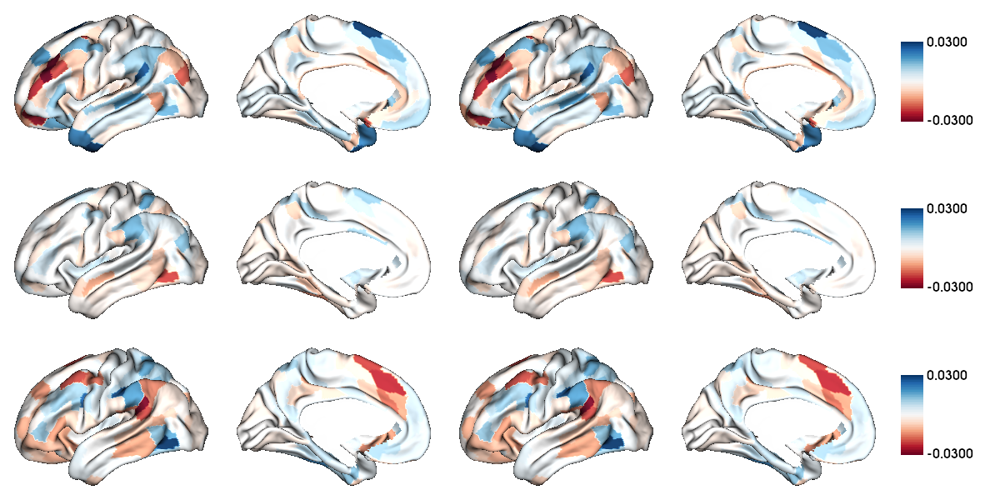

In [119]:
fu.plot_mean_save_sd(mean, sd, 0, 'control_adult_intra_GSR')

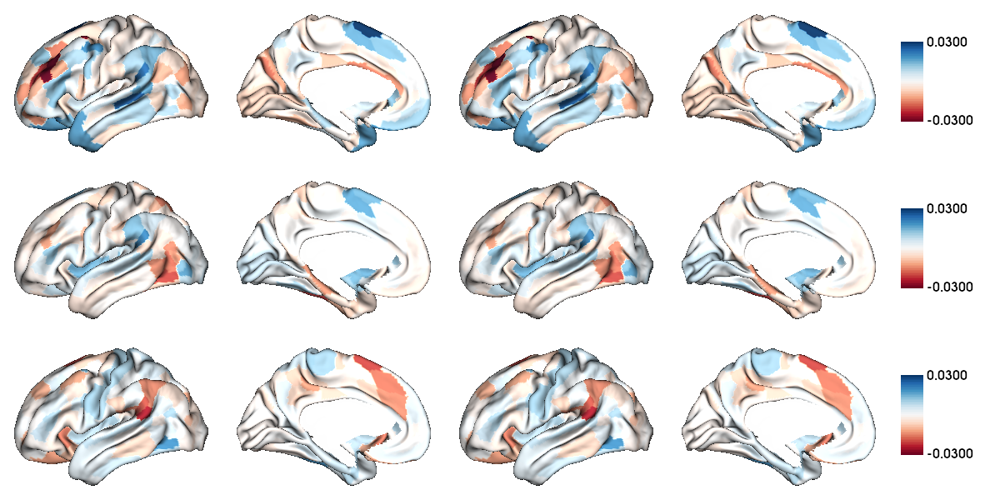

In [120]:
fu.plot_mean_save_sd(mean, sd, 1, 'control_adol_intra_GSR')

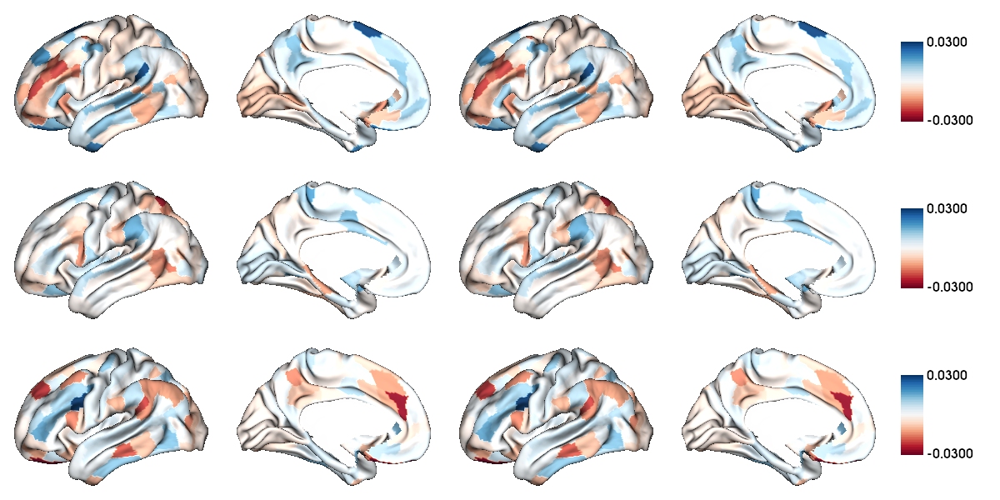

In [121]:
fu.plot_mean_save_sd(mean, sd, 2, 'control_kid_intra_GSR')

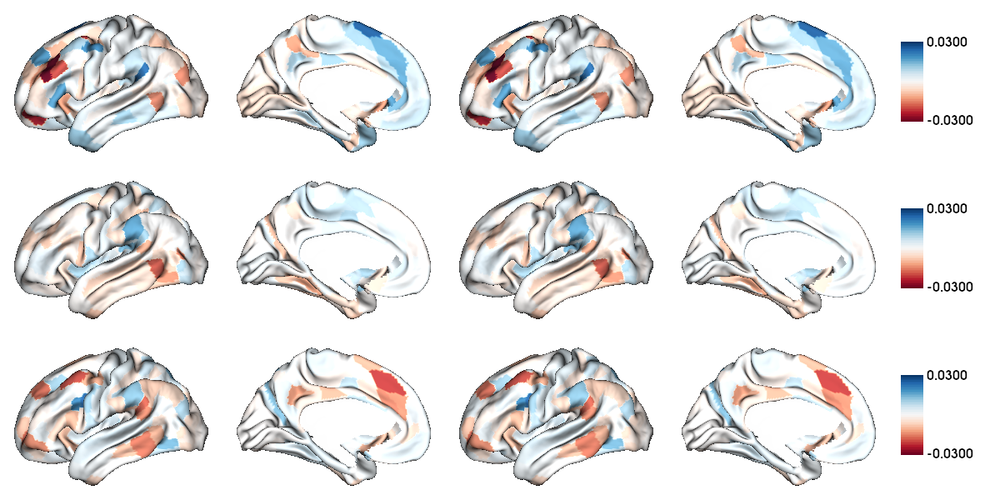

In [122]:
fu.plot_mean_save_sd(mean, sd, 3, 'asd_adult_intra_GSR')

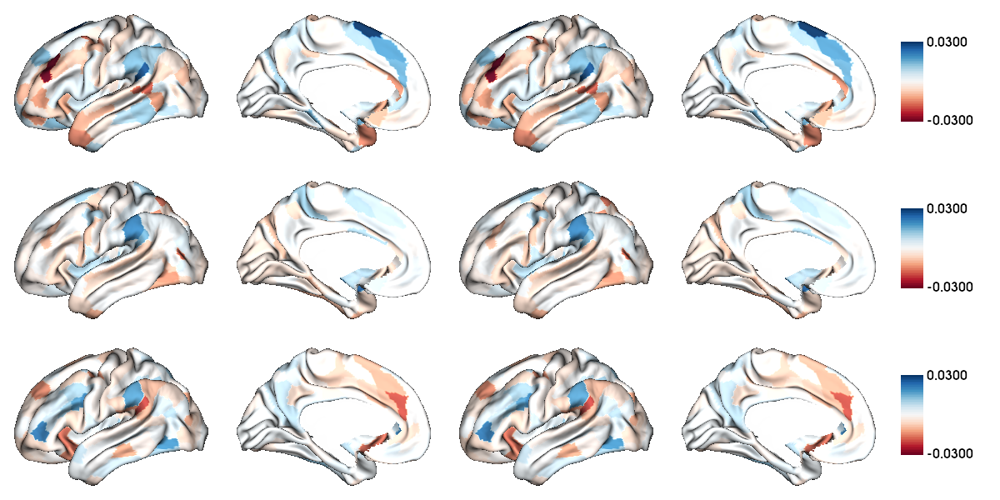

In [123]:
fu.plot_mean_save_sd(mean, sd, 4, 'asd_adol_intra_GSR')

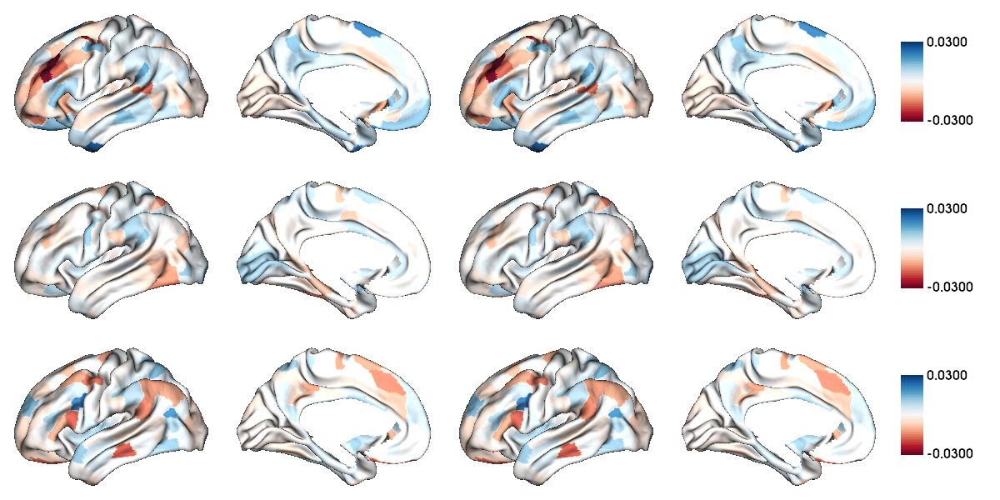

In [124]:
fu.plot_mean_save_sd(mean, sd, 5, 'asd_kid_intra_GSR')

### Correlations

In [125]:
data = [np.genfromtxt('../results/mean_control_adult_intra_GSR.csv'),
        np.genfromtxt('../results/mean_control_adol_intra_GSR.csv'),
        np.genfromtxt('../results/mean_control_kid_intra_GSR.csv'),
        np.genfromtxt('../results/mean_asd_adult_intra_GSR.csv'),
        np.genfromtxt('../results/mean_asd_adol_intra_GSR.csv'),
        np.genfromtxt('../results/mean_asd_kid_intra_GSR.csv')]

In [126]:
hcp_intra = np.loadtxt('../../evolution/results/gradient/mean_asym_LLRR.csv', delimiter=',')
[ss.pearsonr(hcp_intra[:,0], data[0][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[0][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[0][:,2]),
 ss.pearsonr(hcp_intra[:,0], data[1][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[1][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[1][:,2]),
 ss.pearsonr(hcp_intra[:,0], data[2][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[2][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[2][:,2]),
 ss.pearsonr(hcp_intra[:,0], data[3][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[3][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[3][:,2]),
 ss.pearsonr(hcp_intra[:,0], data[4][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[4][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[4][:,2]),
 ss.pearsonr(hcp_intra[:,0], data[5][:,0]),
 ss.pearsonr(hcp_intra[:,1], data[5][:,1]),
 ss.pearsonr(hcp_intra[:,2], data[5][:,2])]

[(0.6519755416271479, 3.66669364748931e-23),
 (0.42274209502510923, 3.3863491921080168e-09),
 (0.7194603473171047, 5.47374020909335e-30),
 (0.660305682096974, 6.559964721305948e-24),
 (0.3748898802320211, 2.1602728764465477e-07),
 (0.6011728038500579, 4.547791986288532e-19),
 (0.563506021613278, 1.7910436705989782e-16),
 (0.4057900299156052, 1.5918705143209667e-08),
 (0.49650120912794193, 1.3577855439370354e-12),
 (0.6094549862520668, 1.097311920252605e-19),
 (0.30153790829434923, 3.8965409588369376e-05),
 (0.5761068514731079, 2.6413769206819042e-17),
 (0.3420239926104723, 2.610937432768659e-06),
 (0.37335067854172144, 2.443054132651398e-07),
 (0.5299027148319013, 2.0217910814716786e-14),
 (0.5710457175728249, 5.754160589864951e-17),
 (0.36260261869032445, 5.667136547937524e-07),
 (0.5645795397499227, 1.5263636382610278e-16)]

In [127]:
# g1
spin_con_asd_intra_adult = fu.spin_pearson_pair(hcp_intra[:,0], data[0][:,0], data[3][:,0])
spin_con_asd_intra_adol = fu.spin_pearson_pair(hcp_intra[:,0], data[1][:,0], data[4][:,0])
spin_con_asd_intra_kid = fu.spin_pearson_pair(hcp_intra[:,0], data[2][:,0], data[5][:,0])
[spin_con_asd_intra_adult.spin_p1, spin_con_asd_intra_adult.spin_p2,
 spin_con_asd_intra_adol.spin_p1, spin_con_asd_intra_adol.spin_p2,
 spin_con_asd_intra_kid.spin_p1, spin_con_asd_intra_kid.spin_p2]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [128]:
# g2
spin_con_asd_intra_adult = fu.spin_pearson_pair(hcp_intra[:,1], data[0][:,1], data[3][:,1])
spin_con_asd_intra_adol = fu.spin_pearson_pair(hcp_intra[:,1], data[1][:,1], data[4][:,1])
spin_con_asd_intra_kid = fu.spin_pearson_pair(hcp_intra[:,1], data[2][:,1], data[5][:,1])
[spin_con_asd_intra_adult.spin_p1, spin_con_asd_intra_adult.spin_p2,
 spin_con_asd_intra_adol.spin_p1, spin_con_asd_intra_adol.spin_p2,
 spin_con_asd_intra_kid.spin_p1, spin_con_asd_intra_kid.spin_p2]

[0.0, 0.007, 0.0, 0.0, 0.0, 0.0]

In [129]:
# g3
spin_con_asd_intra_adult = fu.spin_pearson_pair(hcp_intra[:,2], data[0][:,2], data[3][:,2])
spin_con_asd_intra_adol = fu.spin_pearson_pair(hcp_intra[:,2], data[1][:,2], data[4][:,2])
spin_con_asd_intra_kid = fu.spin_pearson_pair(hcp_intra[:,2], data[2][:,2], data[5][:,2])
[spin_con_asd_intra_adult.spin_p1, spin_con_asd_intra_adult.spin_p2,
 spin_con_asd_intra_adol.spin_p1, spin_con_asd_intra_adol.spin_p2,
 spin_con_asd_intra_kid.spin_p1, spin_con_asd_intra_kid.spin_p2]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [130]:
res = fu.res
[res(hcp_intra[:,0], data[0][:,0]),
 res(hcp_intra[:,1], data[0][:,1]),
 res(hcp_intra[:,2], data[0][:,2]),
 res(hcp_intra[:,0], data[1][:,0]),
 res(hcp_intra[:,1], data[1][:,1]),
 res(hcp_intra[:,2], data[1][:,2]),
 res(hcp_intra[:,0], data[2][:,0]),
 res(hcp_intra[:,1], data[2][:,1]),
 res(hcp_intra[:,2], data[2][:,2]),
 res(hcp_intra[:,0], data[3][:,0]),
 res(hcp_intra[:,1], data[3][:,1]),
 res(hcp_intra[:,2], data[3][:,2]),
 res(hcp_intra[:,0], data[4][:,0]),
 res(hcp_intra[:,1], data[4][:,1]),
 res(hcp_intra[:,2], data[4][:,2]),
 res(hcp_intra[:,0], data[5][:,0]),
 res(hcp_intra[:,1], data[5][:,1]),
 res(hcp_intra[:,2], data[5][:,2])]

[BootstrapResult(confidence_interval=ConfidenceInterval(low=0.5342706633451278, high=0.7475528109777138), standard_error=0.05525486327198555),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.21505283531656574, high=0.5867445496265888), standard_error=0.09418956955255106),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.632631780794548, high=0.7799912354153758), standard_error=0.03706067050045836),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.5602464325334834, high=0.7452241164623761), standard_error=0.0478685466313933),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.17368323209534342, high=0.5472109326970905), standard_error=0.09634513205705665),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.49525586205495564, high=0.6847733325564944), standard_error=0.04789109360088199),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.40876554800773346, high=0.6808009595877541), standard_error=0.06966050450210817

### network-wise

In [131]:
path = '../results/GSR/grad/network/intra/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [132]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(matrix_total)

In [133]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [134]:
t_g1, t_g2, t_g3, t_g123

(array([-2.38176557, -0.73011244, -0.2315738 ,  1.03049863,  0.17476667,
        -0.39579166, -0.01372595,  1.53190109, -0.06483067, -1.56639086,
         0.83064576,  0.29481522]),
 array([ 0.65122524,  0.04263862,  0.57417743,  1.79521095, -2.33381309,
        -0.40244467, -1.46564322,  1.01426225, -0.13532024, -1.09671901,
        -0.2529971 ,  0.74075835]),
 array([ 1.030807  , -2.06254139,  0.69912126, -0.11537153, -1.13268073,
         3.7346043 ,  0.8200016 ,  1.19691893, -0.75292759,  0.17912617,
        -1.65085922,  0.51459108]),
 array([2.876223  , 2.28945174, 1.02279871, 1.85382415, 2.92952844,
        3.81870653, 1.76352674, 1.80494461, 0.76451079, 2.12942512,
        1.70431433, 0.91902869]))

In [135]:
p_g1, p_g2, p_g3, p_g123

(array([0.01790043, 0.46593404, 0.81703881, 0.30366849, 0.86138974,
        0.69256122, 0.98905843, 0.12667992, 0.94835525, 0.11839061,
        0.40688402, 0.76835429]),
 array([0.51543711, 0.9660201 , 0.56631035, 0.07370228, 0.02031574,
        0.68766496, 0.14387157, 0.31133639, 0.89245626, 0.27370994,
        0.80045677, 0.45946294]),
 array([3.03524085e-01, 4.00817477e-02, 4.85058661e-01, 9.08233638e-01,
        2.58320819e-01, 2.27928987e-04, 4.12915174e-01, 2.32354184e-01,
        4.52128259e-01, 8.57968643e-01, 9.98924797e-02, 6.07246196e-01]),
 array([2.16756569e-03, 1.14000140e-02, 1.53644521e-01, 3.24098515e-02,
        1.83761260e-03, 8.26731097e-05, 3.94531108e-02, 3.60807131e-02,
        2.22604512e-01, 1.70472894e-02, 4.47178405e-02, 1.79437208e-01]))

In [136]:
fdr(p_g1), fdr(p_g2), fdr(p_g3), fdr(p_g123)

(array([0.2148052 , 0.93186809, 1.        , 0.91100546, 1.        ,
        1.        , 0.98905843, 0.50671969, 1.        , 0.71034367,
        0.97652165, 1.        ]),
 array([0.88360647, 0.9660201 , 0.84946553, 0.44221366, 0.24378892,
        0.91688662, 0.57548627, 0.74720734, 0.97358865, 0.82112982,
        0.96054812, 0.91892588]),
 array([0.60704817, 0.24049049, 0.64674488, 0.90823364, 0.61996997,
        0.00273515, 0.70785458, 0.69706255, 0.67819239, 0.93596579,
        0.39956992, 0.72869543]),
 array([0.00867026, 0.03420004, 0.18437343, 0.0648197 , 0.01102568,
        0.00099208, 0.05917967, 0.06185265, 0.22260451, 0.04091349,
        0.05962379, 0.19574968]))

In [137]:
mean = np.zeros((6,12,3))
sd = np.zeros((6,12,3))
ste = np.zeros((6,12,3))
name = ['control_adult', 'control_adol', 'control_kid', 'asd_adult', 'asd_adol', 'asd_kid']
for j in range(6):
  for i in range(12):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()
      ste[j,i,n] = se(matrix_total[age_dx[j]][:,i][:,n])
  np.savetxt('../results/GSR/intra_mean_ca_'+name[j]+'.csv', mean[j])
  np.savetxt('../results/GSR/intra_sd_ca_'+name[j]+'.csv', sd[j])

In [138]:
t_pfdr(0, 3, 12, 'group', 'ca_intra_adult_con_asd')
t_pfdr(1, 4, 12, 'group', 'ca_intra_adol_con_asd')
t_pfdr(2, 5, 12, 'group', 'ca_intra_kid_con_asd')
t_pfdr(0, 1, 12, 'age', 'ca_intra_con_adult_adol')
t_pfdr(0, 2, 12, 'age', 'ca_intra_con_adult_kid')
t_pfdr(1, 2, 12, 'age', 'ca_intra_con_adol_kid')
t_pfdr(3, 4, 12, 'age', 'ca_intra_asd_adult_adol')
t_pfdr(3, 5, 12, 'age', 'ca_intra_asd_adult_kid')
t_pfdr(4, 5, 12, 'age', 'ca_intra_asd_adol_kid')

Finish saving ca_intra_adult_con_asd
Finish saving ca_intra_adol_con_asd
Finish saving ca_intra_kid_con_asd
Finish saving ca_intra_con_adult_adol
Finish saving ca_intra_con_adult_kid
Finish saving ca_intra_con_adol_kid
Finish saving ca_intra_asd_adult_adol
Finish saving ca_intra_asd_adult_kid
Finish saving ca_intra_asd_adol_kid


In [139]:
[np.where(np.logical_and(p_g1<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g2<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g3<0.05, fdr(p_g123)<0.05))[0]]

[array([0]), array([4]), array([1, 5])]

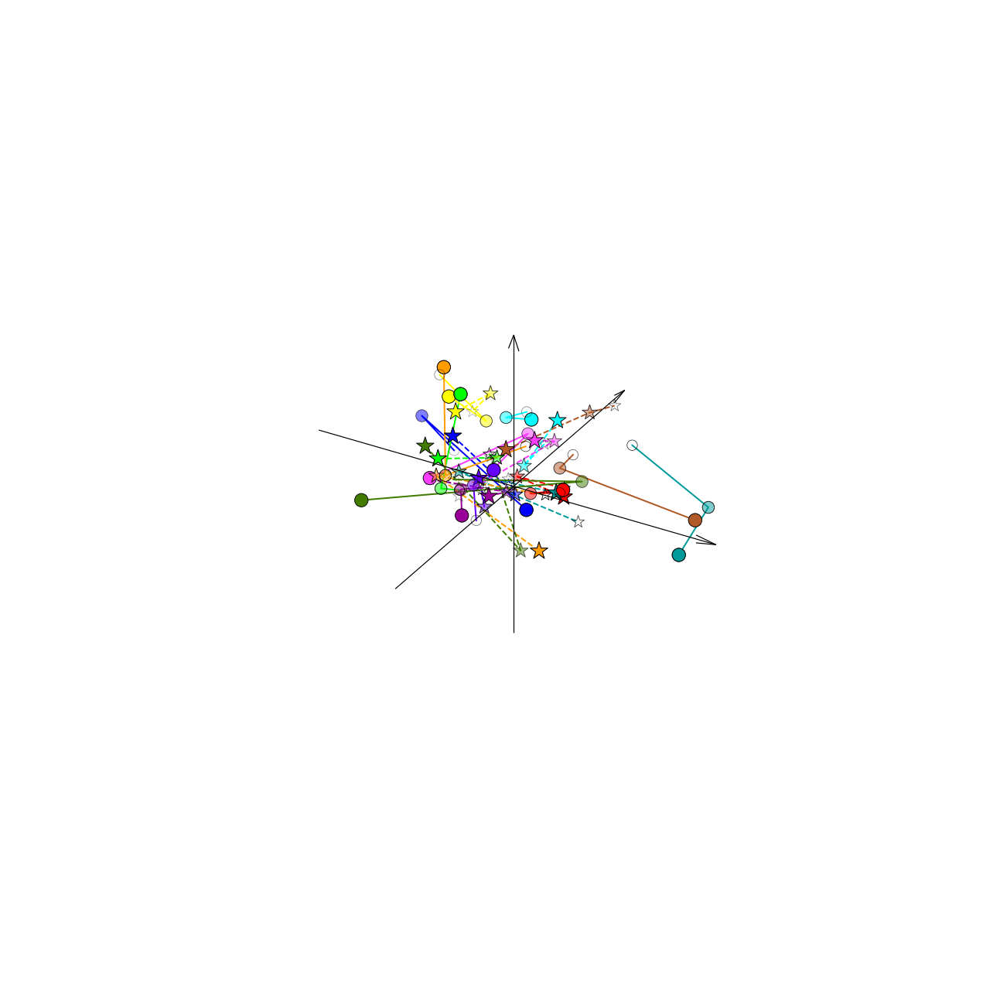

In [140]:
title = ['Control adults', 'ASD adults',
         'Control adolescents','ASD adolescents', 
         'Controls children', 'ASD children']
#mean = [mean[0], mean[3], mean[1], mean[4], mean[2], mean[5]]
sns.set_context("paper", font_scale = 0.8)
fig = plt.figure(figsize=(18,18))
m = [1,1,2,2,3,3]
j = [1,2,1,2,1,2]
ax = fig.add_subplot(projection='3d')
ax.set_xlim(-0.02, 0.02)
ax.set_ylim(-0.02, 0.02)
ax.set_zlim(-0.02, 0.02)
ax.set_xticks(np.arange(-0.02,0.02,0.01))
ax.set_yticks(np.arange(-0.02,0.02,0.01))
ax.set_zticks(np.arange(-0.02,0.02,0.01))
ax._axis3don = False
x, y, z = np.array([[-0.015,0,0],[0,-0.015,0],[0,0,-0.015]])
u, v, w = np.array([[0.03,0,0],[0,0.03,0],[0,0,0.03]])
ax.quiver(x,y,z,u,v,w,arrow_length_ratio=0.05, color="black")
ax.grid(False)
for i in range(3):
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-60*i, c = fu.rgb, marker = 'o', alpha=1-0.5*i)
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-140*i, c = fu.rgb, cmap=cmap, marker = '*', alpha=1-0.5*i)
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-60*i, c = [0,0,0,0], marker = 'o')
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-140*i, c = [0,0,0,0], cmap=cmap, marker = '*')
for i in range(12):             
  ax.plot(mean[:3][:,i][:,0], mean[:3][:,i][:,1], mean[:3][:,i][:,2],
          color=fu.rgb[i], ls='-', lw=2)
  ax.plot(mean[3:][:,i][:,0], mean[3:][:,i][:,1], mean[3:][:,i][:,2],
          color=fu.rgb[i], ls='--', lw=2)        
#ax.set_title(title[i], y = 1.0, pad=-110, fontsize=30)
plt.tight_layout()
plt.savefig('../figures/GSR/age_dx_mean_intra_3d_ca.png', dpi=300, transparent=True)

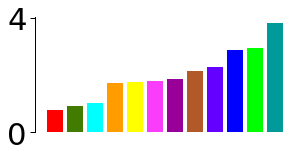

In [141]:
fu.plot_t_single(t_g123, '../figures/GSR/ca_interact_intra_multiT.png')

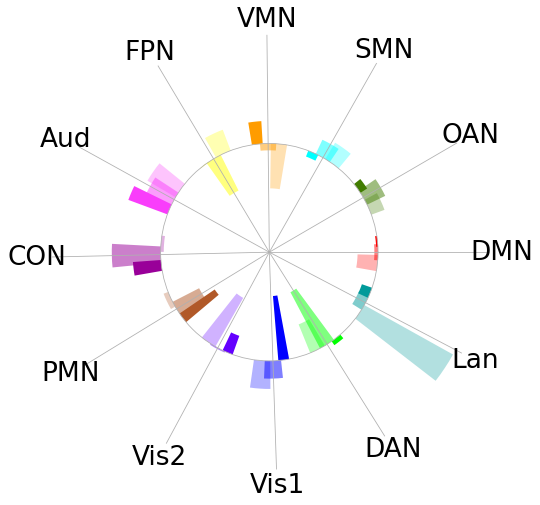

In [142]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/GSR/ca_interact_intra_t_g123.png')

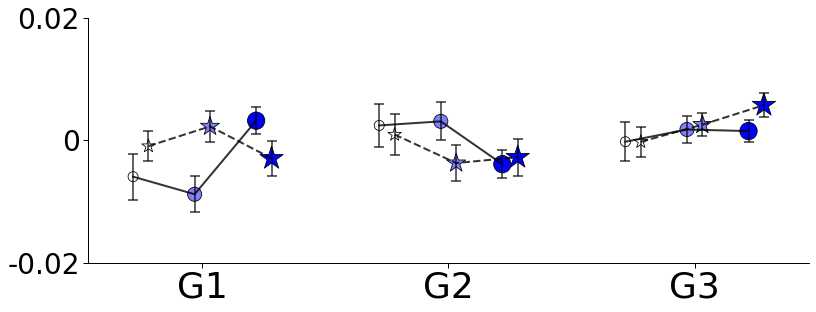

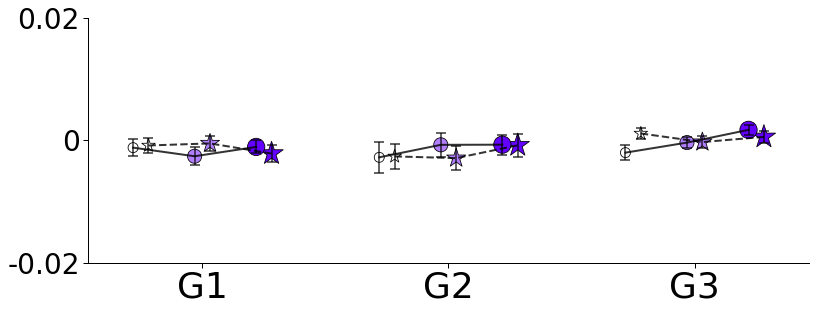

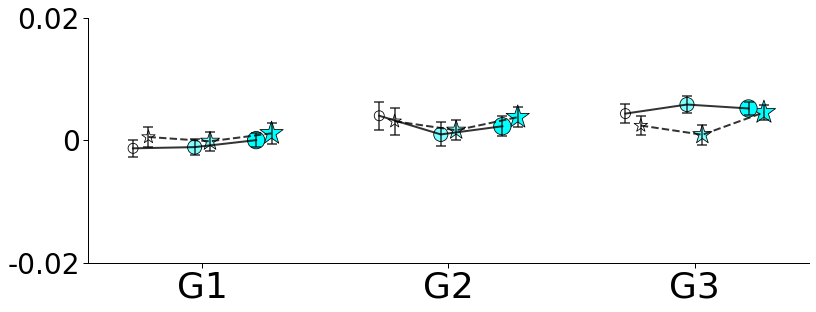

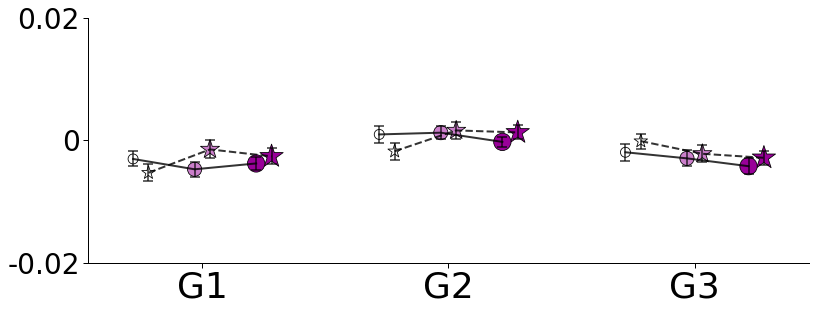

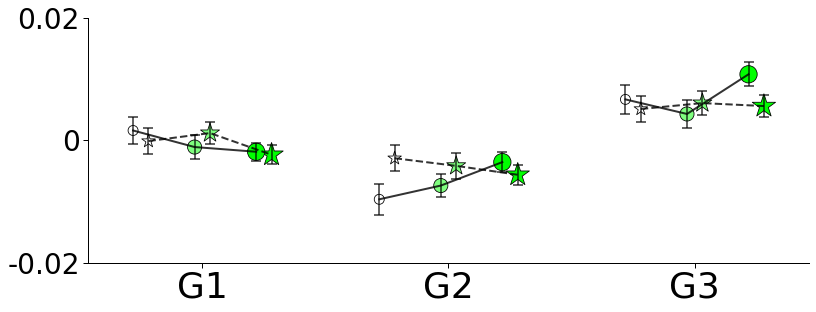

...

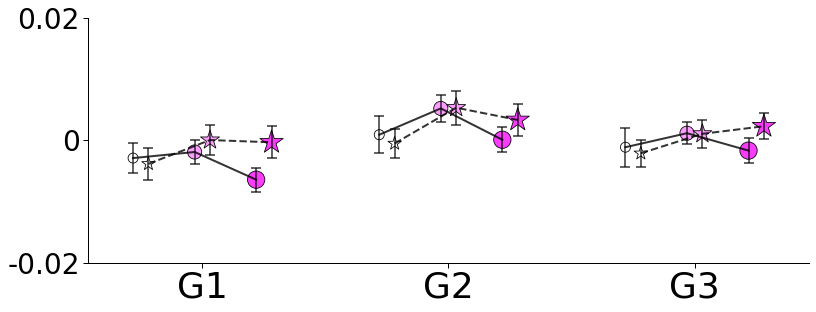

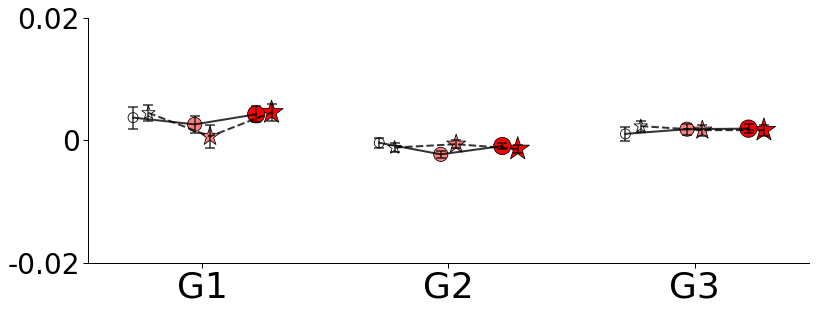

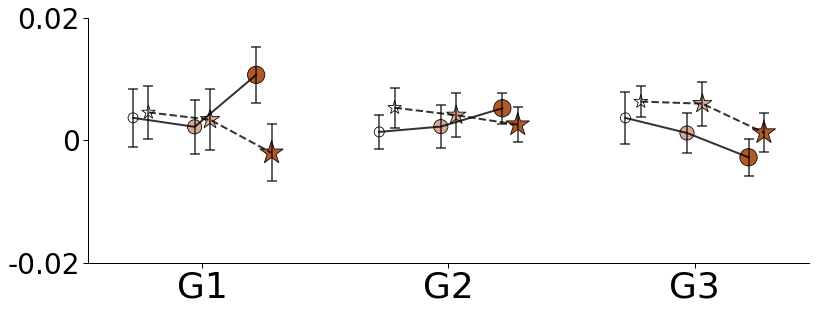

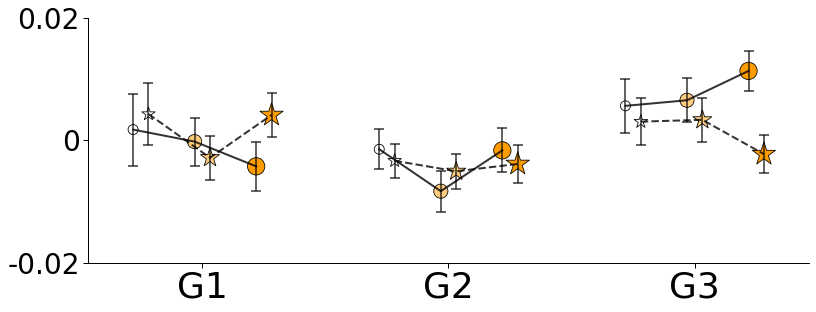

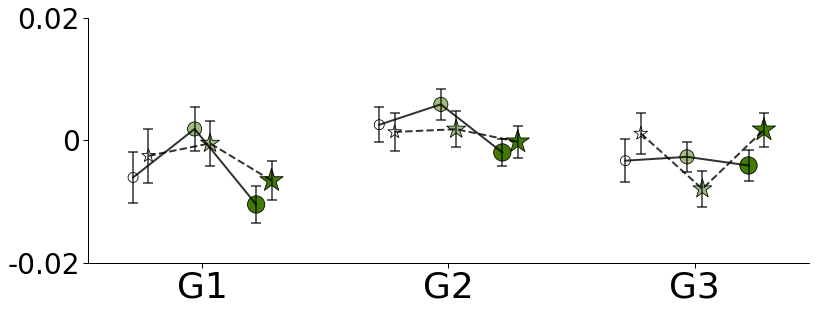

In [143]:
for i in range (12):
  fu.plot_interact(mean, ste, i, 'intra', GSR=True)

## inter

### stats

In [144]:
path = '../results/GSR/grad/inter/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [145]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T)

In [146]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(180)
p_g2 = np.zeros(180)
p_g3 = np.zeros(180)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(180)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(180):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [147]:
t_g1.min(),t_g1.max(),t_g2.min(),t_g2.max(),t_g3.min(),t_g3.max(),t_g123.min(),t_g123.max()

(-2.52699594389651,
 2.3583560363343046,
 -2.521635315668949,
 3.112444343658077,
 -3.0153653562433256,
 2.664402732104695,
 0.1426865434850883,
 3.506967249949226)

In [148]:
p_g1.min(), p_g2.min(), p_g3.min(), p_g123.min()

(0.012057164366453847,
 0.002048097508833301,
 0.0028030406975423305,
 0.0002640145716193371)

In [149]:
fdr(p_g1).min(), fdr(p_g2).min(),fdr(p_g3).min(), fdr(p_g123).min()

(0.881539453580913,
 0.3686575515899942,
 0.3608006914223389,
 0.026229499009298385)

In [150]:
p_g1[p_g1>thres] = 1
p_g2[p_g2>thres] = 1
p_g3[p_g3>thres] = 1
a = fdr(p_g123)
a[a>0.05]=1
np.savetxt('../results/GSR/interact_t_p_g1g2g3_pdfr123_inter.csv', 
           np.vstack((t_g1,t_g2,t_g3,t_g123,p_g1,p_g2,p_g3,a)).T)

In [151]:
t_g1[np.logical_or(p_g1>thres,a==1)] = 0.00001
t_g2[np.logical_or(p_g2>thres,a==1)] = 0.00001
t_g3[np.logical_or(p_g3>thres,a==1)] = 0.00001
t_g123[fdr(p_g123)>0.05] = 0.00001

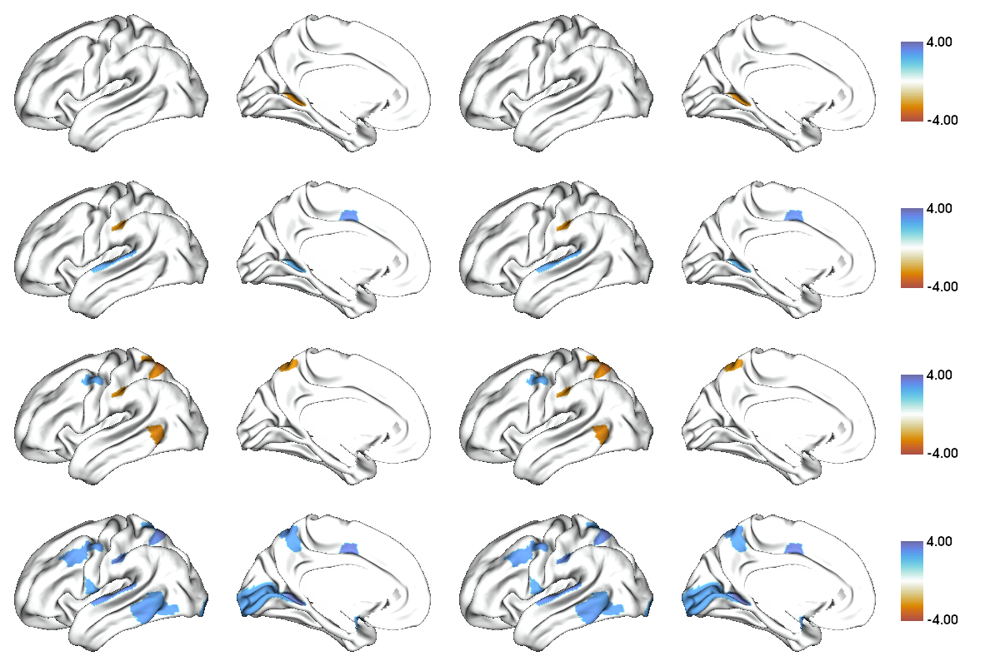

In [152]:
t = [t_g1, t_g2, t_g3, t_g123]
grad = [None] * 4
mask = mmp_ll != 0
for i in range(4):
  grad[i] = map_to_labels(np.concatenate((t[i],t[i])), mmp_ll, mask=mask)
  grad[i][grad[i]==0]=np.nan

fu.plot_surface_ll(data=grad, size=(1200,800), cmap=cmr.prinsenvlag, color_range=(-4, 4), 
                   filename='../figures/GSR/interact_t_inter.png')

In [153]:
mean = np.zeros((6,180,3))
sd = np.zeros((6,180,3))
for j in range(6):
  for i in range(180):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()

In [154]:
t_pfdr(0, 3, 180,  'group', 'inter_adult_con_asd')
t_pfdr(1, 4, 180, 'group', 'inter_adol_con_asd')
t_pfdr(2, 5, 180, 'group', 'inter_kid_con_asd')
t_pfdr(0, 1, 180, 'age', 'inter_con_adult_adol')
t_pfdr(0, 2, 180, 'age', 'inter_con_adult_kid')
t_pfdr(1, 2, 180, 'age', 'inter_con_adol_kid')
t_pfdr(3, 4, 180, 'age', 'inter_asd_adult_adol')
t_pfdr(3, 5, 180, 'age', 'inter_asd_adult_kid')
t_pfdr(4, 5, 180, 'age', 'inter_asd_adol_kid')

Finish saving inter_adult_con_asd
Finish saving inter_adol_con_asd
Finish saving inter_kid_con_asd
Finish saving inter_con_adult_adol
Finish saving inter_con_adult_kid
Finish saving inter_con_adol_kid
Finish saving inter_asd_adult_adol
Finish saving inter_asd_adult_kid
Finish saving inter_asd_adol_kid


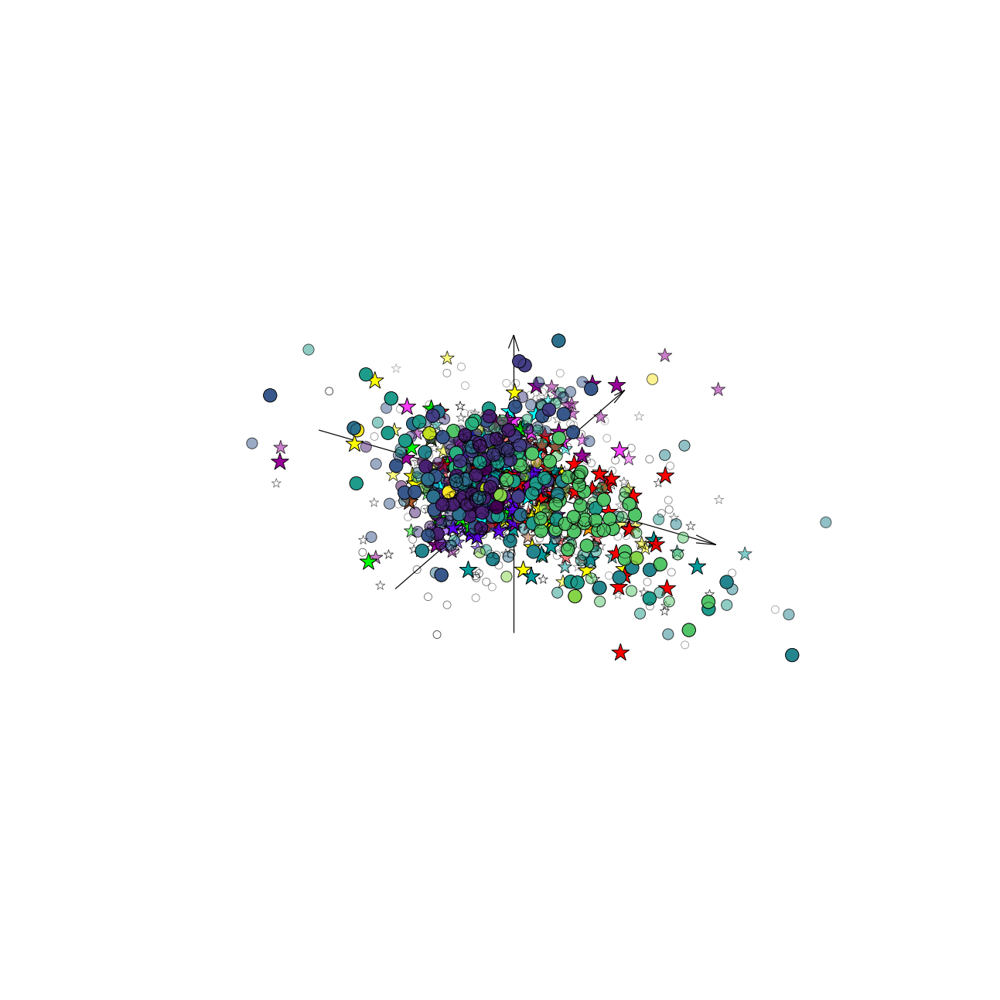

In [155]:
title = ['Control adults', 'ASD adults',
         'Control adolescents','ASD adolescents', 
         'Controls children', 'ASD children']
#mean = [mean[0], mean[3], mean[1], mean[4], mean[2], mean[5]]
sns.set_context("paper", font_scale = 0.8)
fig = plt.figure(figsize=(18,18))
m = [1,1,2,2,3,3]
j = [1,2,1,2,1,2]
ax = fig.add_subplot(projection='3d')
ax.set_xlim(-0.04, 0.04)
ax.set_ylim(-0.04, 0.04)
ax.set_zlim(-0.04, 0.04)
ax.set_xticks(np.arange(-0.04,0.04,0.02))
ax.set_yticks(np.arange(-0.04,0.04,0.02))
ax.set_zticks(np.arange(-0.04,0.04,0.02))
ax._axis3don = False
x, y, z = np.array([[-0.03,0,0],[0,-0.03,0],[0,0,-0.03]])
u, v, w = np.array([[0.06,0,0],[0,0.06,0],[0,0,0.06]])
ax.quiver(x,y,z,u,v,w,arrow_length_ratio=0.05, color="black")
ax.grid(False)
for i in range(3):
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-100*i, c = color, marker = 'o', alpha=1-0.5*i)
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-200*i, c = color, cmap=cmap, marker = '*', alpha=1-0.5*i)
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-100*i, c = [0,0,0,0], marker = 'o')
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-200*i, c = [0,0,0,0], cmap=cmap, marker = '*')
#ax.set_title(title[i], y = 1.0, pad=-110, fontsize=30)
plt.tight_layout()
plt.savefig('../figures/GSR/age_dx_mean_inter_3d.png', dpi=300, transparent=True)

### parcel-wise

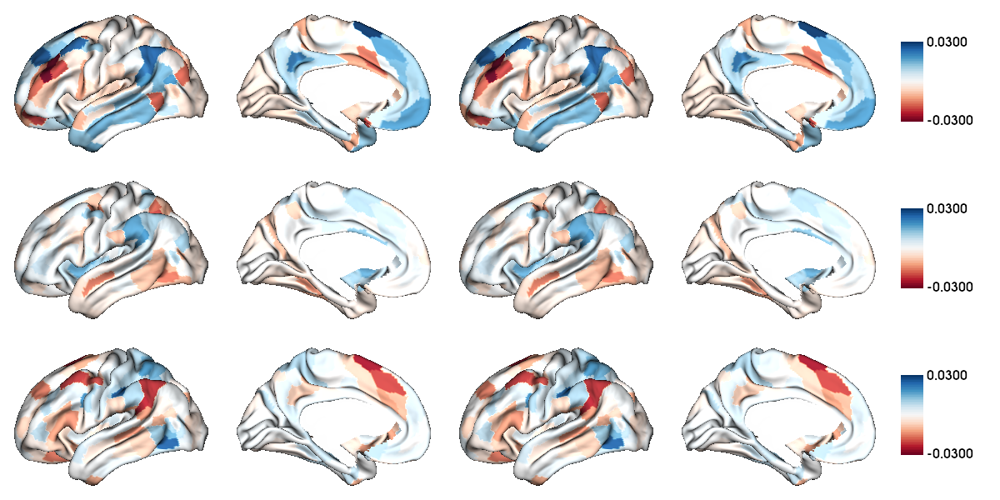

In [156]:
fu.plot_mean_save_sd(mean, sd, 0, 'control_adult_inter_GSR')

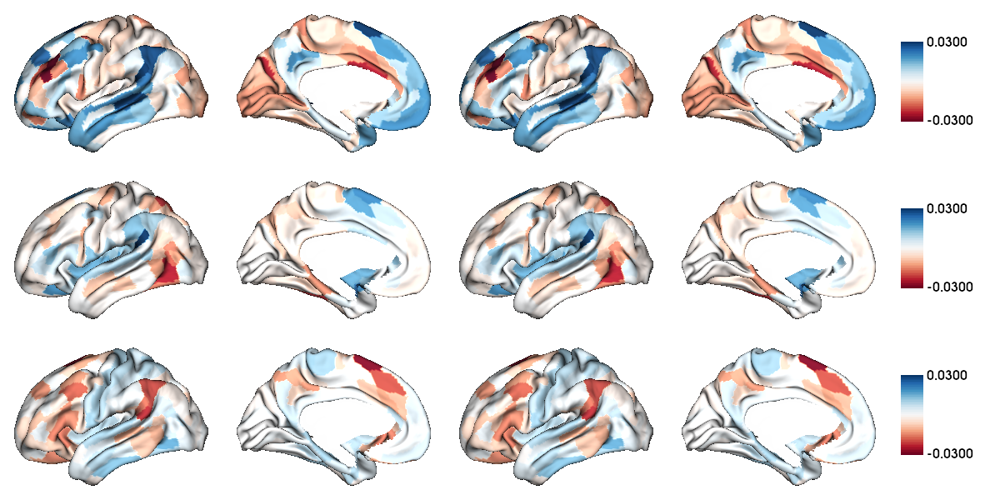

In [157]:
fu.plot_mean_save_sd(mean, sd, 1, 'control_adol_inter_GSR')

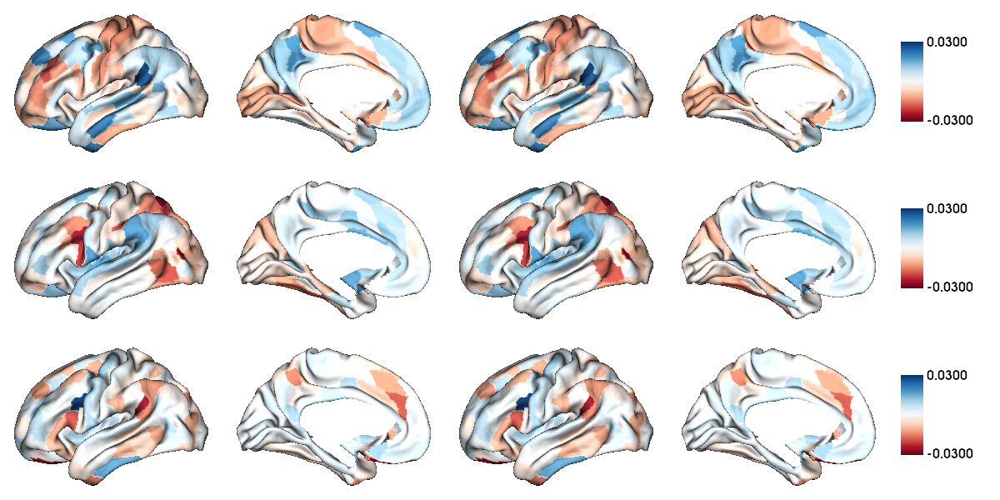

In [158]:
fu.plot_mean_save_sd(mean, sd, 2, 'control_kid_inter_GSR')

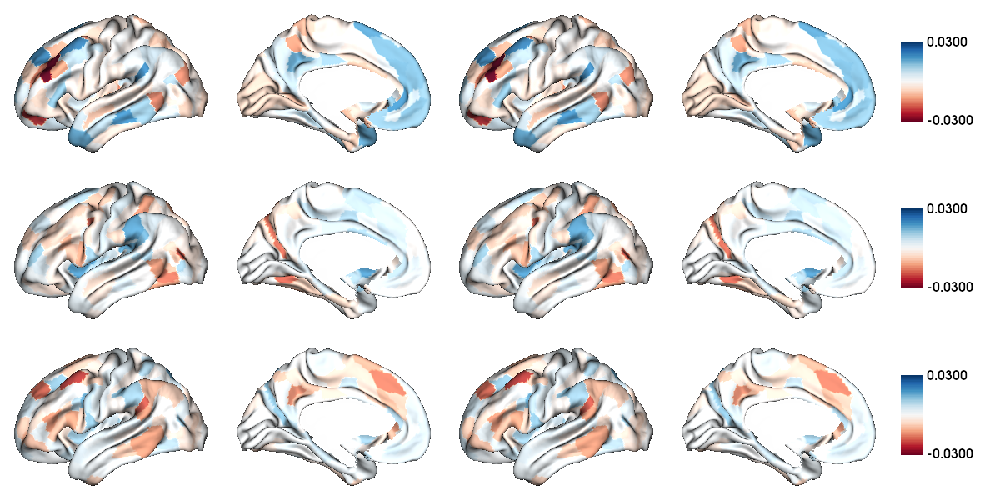

In [159]:
fu.plot_mean_save_sd(mean, sd, 3, 'asd_adult_inter_GSR')

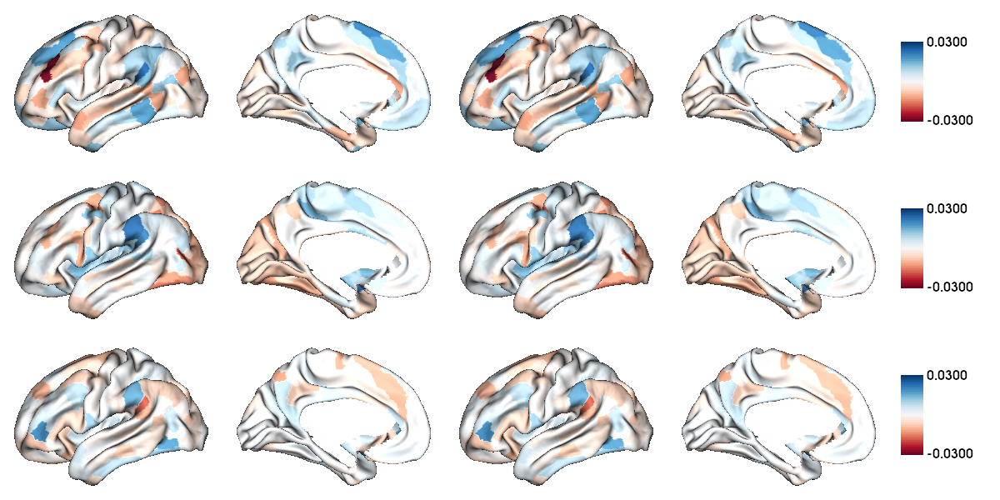

In [160]:
fu.plot_mean_save_sd(mean, sd, 4, 'asd_adol_inter_GSR')

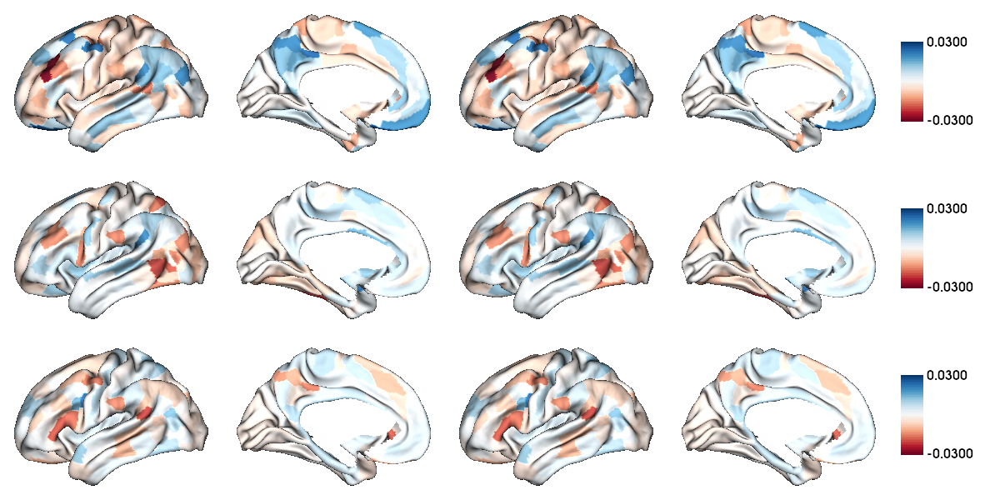

In [161]:
fu.plot_mean_save_sd(mean, sd, 5, 'asd_kid_inter_GSR')

### correlation

In [162]:
data = [np.genfromtxt('../results/mean_control_adult_inter_GSR.csv'),
        np.genfromtxt('../results/mean_control_adol_inter_GSR.csv'),
        np.genfromtxt('../results/mean_control_kid_inter_GSR.csv'),
        np.genfromtxt('../results/mean_asd_adult_inter_GSR.csv'),
        np.genfromtxt('../results/mean_asd_adol_inter_GSR.csv'),
        np.genfromtxt('../results/mean_asd_kid_inter_GSR.csv')]

In [163]:
hcp_inter = np.loadtxt('../../evolution/results/gradient/mean_asym_LRRL.csv', delimiter=',')
[ss.pearsonr(hcp_inter[:,0], data[0][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[0][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[0][:,2]),
 ss.pearsonr(hcp_inter[:,0], data[1][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[1][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[1][:,2]),
 ss.pearsonr(hcp_inter[:,0], data[2][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[2][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[2][:,2]),
 ss.pearsonr(hcp_inter[:,0], data[3][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[3][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[3][:,2]),
 ss.pearsonr(hcp_inter[:,0], data[4][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[4][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[4][:,2]),
 ss.pearsonr(hcp_inter[:,0], data[5][:,0]),
 ss.pearsonr(hcp_inter[:,1], data[5][:,1]),
 ss.pearsonr(hcp_inter[:,2], data[5][:,2])]

[(0.4929809222599015, 2.0609316922603327e-12),
 (0.44141778021628875, 5.55728097079783e-10),
 (0.6311111818586358, 2.1735915620217226e-21),
 (0.42003404898346397, 4.3614248423484345e-09),
 (0.2522325153528891, 0.0006357649069944668),
 (0.5870406108788655, 4.6888530872525455e-18),
 (0.40707091915864435, 1.4204081091527433e-08),
 (0.4075198883144936, 1.364630983026216e-08),
 (0.4154392708438684, 6.666238614118752e-09),
 (0.5081965964150069, 3.278061062819899e-13),
 (0.29860760845512035, 4.668773773254689e-05),
 (0.543390704166293, 3.230447739104938e-15),
 (0.4042998048690323, 1.8164750204909218e-08),
 (0.3124122314297185, 1.9581442188745365e-05),
 (0.47222340977724603, 2.1961191702699986e-11),
 (0.4706237146541591, 2.6182938991262747e-11),
 (0.34075184844969164, 2.8594817258915263e-06),
 (0.4478277899071522, 2.912776647803846e-10)]

In [164]:
# g1
spin_con_asd_inter_adult = fu.spin_pearson_pair(hcp_inter[:,0], data[0][:,0], data[3][:,0])
spin_con_asd_inter_adol = fu.spin_pearson_pair(hcp_inter[:,0], data[1][:,0], data[4][:,0])
spin_con_asd_inter_kid = fu.spin_pearson_pair(hcp_inter[:,0], data[2][:,0], data[5][:,0])
[spin_con_asd_inter_adult.spin_p1, spin_con_asd_inter_adult.spin_p2,
 spin_con_asd_inter_adol.spin_p1, spin_con_asd_inter_adol.spin_p2,
 spin_con_asd_inter_kid.spin_p1, spin_con_asd_inter_kid.spin_p2]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [165]:
# g2
spin_con_asd_inter_adult = fu.spin_pearson_pair(hcp_inter[:,1], data[0][:,1], data[3][:,1])
spin_con_asd_inter_adol = fu.spin_pearson_pair(hcp_inter[:,1], data[1][:,1], data[4][:,1])
spin_con_asd_inter_kid = fu.spin_pearson_pair(hcp_inter[:,1], data[2][:,1], data[5][:,1])
[spin_con_asd_inter_adult.spin_p1, spin_con_asd_inter_adult.spin_p2,
 spin_con_asd_inter_adol.spin_p1, spin_con_asd_inter_adol.spin_p2,
 spin_con_asd_inter_kid.spin_p1, spin_con_asd_inter_kid.spin_p2]

[0.0, 0.01, 0.084, 0.018, 0.001, 0.004]

In [166]:
# g3
spin_con_asd_inter_adult = fu.spin_pearson_pair(hcp_inter[:,2], data[0][:,2], data[3][:,2])
spin_con_asd_inter_adol = fu.spin_pearson_pair(hcp_inter[:,2], data[1][:,2], data[4][:,2])
spin_con_asd_inter_kid = fu.spin_pearson_pair(hcp_inter[:,2], data[2][:,2], data[5][:,2])
[spin_con_asd_inter_adult.spin_p1, spin_con_asd_inter_adult.spin_p2,
 spin_con_asd_inter_adol.spin_p1, spin_con_asd_inter_adol.spin_p2,
 spin_con_asd_inter_kid.spin_p1, spin_con_asd_inter_kid.spin_p2]

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [167]:
[res(hcp_inter[:,0], data[0][:,0]),
 res(hcp_inter[:,1], data[0][:,1]),
 res(hcp_inter[:,2], data[0][:,2]),
 res(hcp_inter[:,0], data[1][:,0]),
 res(hcp_inter[:,1], data[1][:,1]),
 res(hcp_inter[:,2], data[1][:,2]),
 res(hcp_inter[:,0], data[2][:,0]),
 res(hcp_inter[:,1], data[2][:,1]),
 res(hcp_inter[:,2], data[2][:,2]),
 res(hcp_inter[:,0], data[3][:,0]),
 res(hcp_inter[:,1], data[3][:,1]),
 res(hcp_inter[:,2], data[3][:,2]),
 res(hcp_inter[:,0], data[4][:,0]),
 res(hcp_inter[:,1], data[4][:,1]),
 res(hcp_inter[:,2], data[4][:,2]),
 res(hcp_inter[:,0], data[5][:,0]),
 res(hcp_inter[:,1], data[5][:,1]),
 res(hcp_inter[:,2], data[5][:,2])]

[BootstrapResult(confidence_interval=ConfidenceInterval(low=0.3569772092155764, high=0.6058356827089997), standard_error=0.06339096422357157),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.2576382223606936, high=0.5809283370652766), standard_error=0.08227163771516713),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.5167285403470632, high=0.7072184684360021), standard_error=0.04764120126794235),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.27175674529385346, high=0.5370705893076752), standard_error=0.06706503378639392),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.07541437095449371, high=0.41931690880836753), standard_error=0.08845351745885859),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.4872403307085712, high=0.6608228872991536), standard_error=0.04301549522072428),
 BootstrapResult(confidence_interval=ConfidenceInterval(low=0.2755578209094693, high=0.5269705541356362), standard_error=0.0639027175244637

### network-wise

In [168]:
path = '../results/GSR/grad/network/inter/'
path_list = np.array(phen['ID']).astype(str)
path_list = [path_list[i]+'.csv' for i in range(len(path_list))]
n = len(path_list)
matrix = [None] * n
for i in range(n):
  matrix[i] = np.genfromtxt(path+path_list[i], delimiter=',')[:,:3]
matrix = np.array(matrix).T

matrix_g1 = harmony(matrix[0].T)
matrix_g2 = harmony(matrix[1].T)
matrix_g3 = harmony(matrix[2].T)
matrix_total = np.array([matrix_g1.T,matrix_g2.T,matrix_g3.T]).T

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data


In [169]:
slm_g1 = SLM(model, contrast=model.interact)
slm_g1.fit(matrix_g1)
slm_g2 = SLM(model, contrast=model.interact)
slm_g2.fit(matrix_g2)
slm_g3 = SLM(model, contrast=model.interact)
slm_g3.fit(matrix_g3)
slm_g123 = SLM(model, contrast=model.interact)
slm_g123.fit(matrix_total)

In [170]:
t_g1 = slm_g1.t[0]
t_g2 = slm_g2.t[0]
t_g3 = slm_g3.t[0]
p_g1 = np.zeros(12)
p_g2 = np.zeros(12)
p_g3 = np.zeros(12)
t_g123 = slm_g123.t[0]
p_g123 = np.zeros(12)
dof = model.shape[0] - model.shape[1] # degree of freedom
for i in range(12):
  # p-value for one-sided test two-side= *2, multivariates just one side
  p_g1[i] = ss.t.sf(abs(t_g1[i]), dof) * 2
  p_g2[i] = ss.t.sf(abs(t_g2[i]), dof) * 2
  p_g3[i] = ss.t.sf(abs(t_g3[i]), dof) * 2
  p_g123[i] = ss.t.sf(abs(t_g123[i]), dof)

In [171]:
t_g1, t_g2, t_g3, t_g123

(array([-1.74051298,  0.29824397, -0.61228901,  1.02441896,  0.84874029,
         0.18762627,  0.03225372,  1.17752648, -0.66011216, -1.85048376,
         1.28168043, -0.01913269]),
 array([ 0.7497632 , -0.58041004, -0.20041583,  1.55856602, -1.40140777,
        -0.54465043, -1.01497789,  1.77654295,  0.72115814, -0.02840449,
         0.31237009,  0.93469645]),
 array([ 1.75766403, -2.04885649, -0.23431067,  1.12706426, -1.80881037,
         1.88785733,  0.04145058,  0.83530635,  1.11141959,  0.31424052,
        -1.19379621,  1.19937616]),
 array([2.68063161, 2.27964352, 0.65731625, 2.20440433, 2.37791727,
        2.0885731 , 1.04110138, 2.02998454, 1.54367735, 1.89967896,
        1.65514504, 1.60870977]))

In [172]:
p_g1, p_g2, p_g3, p_g123

(array([0.08287149, 0.76573895, 0.54084525, 0.30652481, 0.39675344,
        0.85130601, 0.97429278, 0.23998892, 0.50972644, 0.0653009 ,
        0.20101887, 0.98474893]),
 array([0.45402908, 0.56210661, 0.84130139, 0.12023271, 0.16220357,
        0.58642902, 0.31099574, 0.07673311, 0.47141608, 0.97735985,
        0.75499261, 0.35075302]),
 array([0.07990133, 0.04141152, 0.81491566, 0.2606837 , 0.07155688,
        0.06008273, 0.96696634, 0.40425997, 0.26734462, 0.75357322,
        0.23357174, 0.23139929]),
 array([0.00389282, 0.01169192, 0.25575974, 0.01415613, 0.00904224,
        0.01882629, 0.14936491, 0.0216534 , 0.06189999, 0.02925318,
        0.04950974, 0.05440538]))

In [173]:
fdr(p_g1), fdr(p_g2), fdr(p_g3), fdr(p_g123)

(array([0.49722895, 1.        , 0.81126787, 0.73565955, 0.79350688,
        1.        , 1.        , 0.71996677, 0.87381675, 0.78361076,
        0.8040755 , 0.98474893]),
 array([0.90805816, 0.84315992, 0.91778333, 0.72139624, 0.64881428,
        0.78190536, 0.93298722, 0.92079737, 0.80814186, 0.97735985,
        0.90599114, 0.84180726]),
 array([0.239704  , 0.49693823, 0.8889989 , 0.44688635, 0.28622751,
        0.36049639, 0.96696634, 0.53901329, 0.40101693, 0.90428786,
        0.46714348, 0.5553583 ]),
 array([0.04671381, 0.04676767, 0.25575974, 0.0424684 , 0.05425344,
        0.04518309, 0.16294354, 0.0433068 , 0.07427999, 0.05014832,
        0.0742646 , 0.0725405 ]))

In [174]:
mean = np.zeros((6,12,3))
sd = np.zeros((6,12,3))
ste = np.zeros((6,12,3))
name = ['control_adult', 'control_adol', 'control_kid', 'asd_adult', 'asd_adol', 'asd_kid']
for j in range(6):
  for i in range(12):
    for n in range(3):
      mean[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].mean()
      sd[j,i,n] = matrix_total[age_dx[j]][:,i][:,n].std()
      ste[j,i,n] = se(matrix_total[age_dx[j]][:,i][:,n])
  np.savetxt('../results/GSR/inter_mean_ca_'+name[j]+'.csv', mean[j])
  np.savetxt('../results/GSR/inter_sd_ca_'+name[j]+'.csv', sd[j])

In [175]:
t_pfdr(0, 3, 12, 'group', 'ca_inter_adult_con_asd')
t_pfdr(1, 4, 12, 'group', 'ca_inter_adol_con_asd')
t_pfdr(2, 5, 12, 'group', 'ca_inter_kid_con_asd')
t_pfdr(0, 1, 12, 'age', 'ca_inter_con_adult_adol')
t_pfdr(0, 2, 12, 'age', 'ca_inter_con_adult_kid')
t_pfdr(1, 2, 12, 'age', 'ca_inter_con_adol_kid')
t_pfdr(3, 4, 12, 'age', 'ca_inter_asd_adult_adol')
t_pfdr(3, 5, 12, 'age', 'ca_inter_asd_adult_kid')
t_pfdr(4, 5, 12, 'age', 'ca_inter_asd_adol_kid')

Finish saving ca_inter_adult_con_asd
Finish saving ca_inter_adol_con_asd
Finish saving ca_inter_kid_con_asd
Finish saving ca_inter_con_adult_adol
Finish saving ca_inter_con_adult_kid
Finish saving ca_inter_con_adol_kid
Finish saving ca_inter_asd_adult_adol
Finish saving ca_inter_asd_adult_kid
Finish saving ca_inter_asd_adol_kid


In [176]:
[np.where(np.logical_and(p_g1<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g2<0.05, fdr(p_g123)<0.05))[0],
 np.where(np.logical_and(p_g3<0.05, fdr(p_g123)<0.05))[0]]

[array([], dtype=int64), array([], dtype=int64), array([1])]

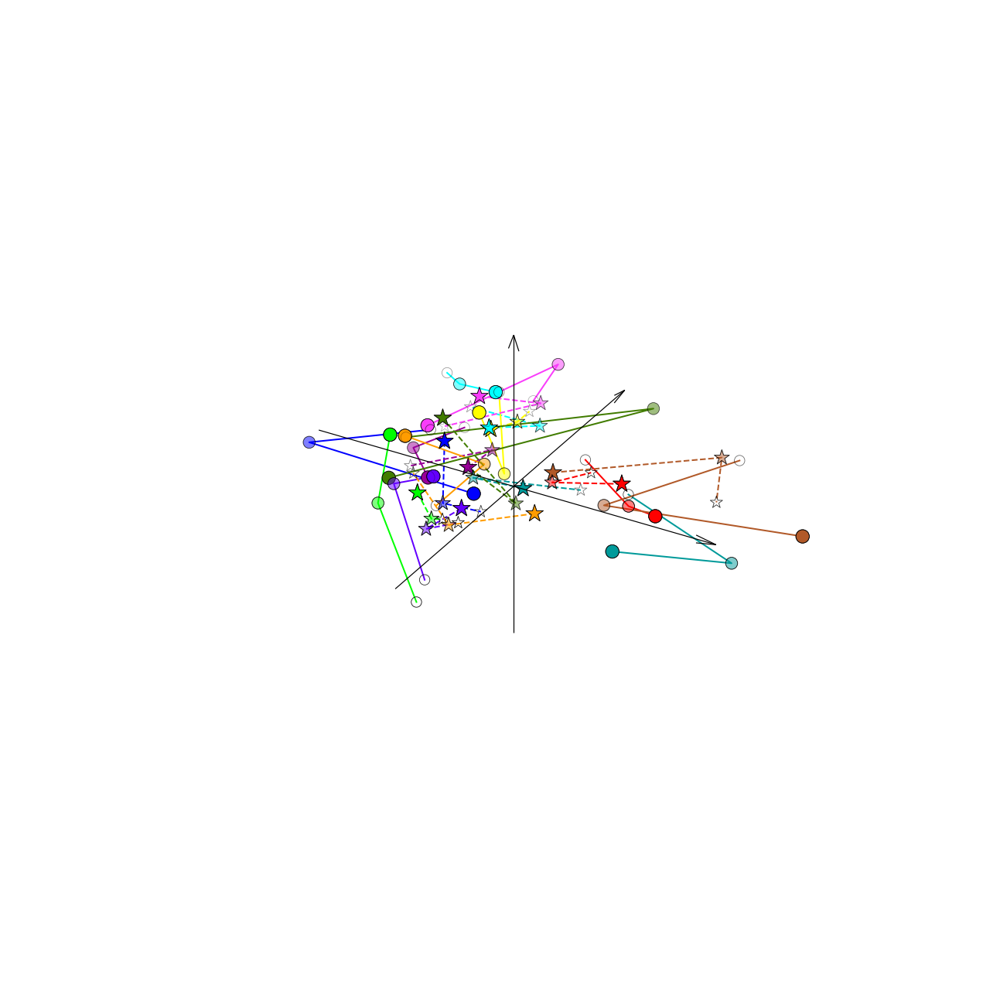

In [177]:
title = ['Control adults', 'ASD adults',
         'Control adolescents','ASD adolescents', 
         'Controls children', 'ASD children']
#mean = [mean[0], mean[3], mean[1], mean[4], mean[2], mean[5]]
sns.set_context("paper", font_scale = 0.8)
fig = plt.figure(figsize=(18,18))
m = [1,1,2,2,3,3]
j = [1,2,1,2,1,2]
ax = fig.add_subplot(projection='3d')
ax.set_xlim(-0.02, 0.02)
ax.set_ylim(-0.02, 0.02)
ax.set_zlim(-0.02, 0.02)
ax.set_xticks(np.arange(-0.02,0.02,0.01))
ax.set_yticks(np.arange(-0.02,0.02,0.01))
ax.set_zticks(np.arange(-0.02,0.02,0.01))
ax._axis3don = False
x, y, z = np.array([[-0.015,0,0],[0,-0.015,0],[0,0,-0.015]])
u, v, w = np.array([[0.03,0,0],[0,0.03,0],[0,0,0.03]])
ax.quiver(x,y,z,u,v,w,arrow_length_ratio=0.05, color="black")
ax.grid(False)
for i in range(3):
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-60*i, c = fu.rgb, marker = 'o', alpha=1-0.5*i)
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-140*i, c = fu.rgb, cmap=cmap, marker = '*', alpha=1-0.5*i)
  ax.scatter(mean[i][:,0], mean[i][:,1], mean[i][:,2], edgecolors=[0,0,0,1], 
             s = 300-60*i, c = [0,0,0,0], marker = 'o')
  ax.scatter(mean[i+3][:,0], mean[i+3][:,1], mean[i+3][:,2], edgecolors=[0,0,0,1],
             s =560-140*i, c = [0,0,0,0], cmap=cmap, marker = '*')
for i in range(12):             
  ax.plot(mean[:3][:,i][:,0], mean[:3][:,i][:,1], mean[:3][:,i][:,2],
          color=fu.rgb[i], ls='-', lw=2)
  ax.plot(mean[3:][:,i][:,0], mean[3:][:,i][:,1], mean[3:][:,i][:,2],
          color=fu.rgb[i], ls='--', lw=2)        
#ax.set_title(title[i], y = 1.0, pad=-110, fontsize=30)
plt.tight_layout()
plt.savefig('../figures/GSR/age_dx_mean_inter_3d_ca.png', dpi=300, transparent=True)

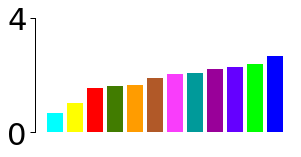

In [178]:
fu.plot_t_single(t_g123, '../figures/GSR/ca_interact_inter_multiT.png')

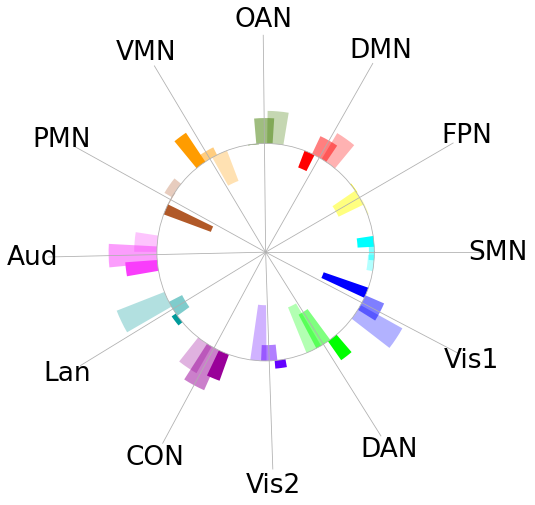

In [179]:
fu.plot_t_multi(t_g1, t_g2, t_g3, t_g123, '../figures/GSR/ca_interact_inter_t_g123.png')

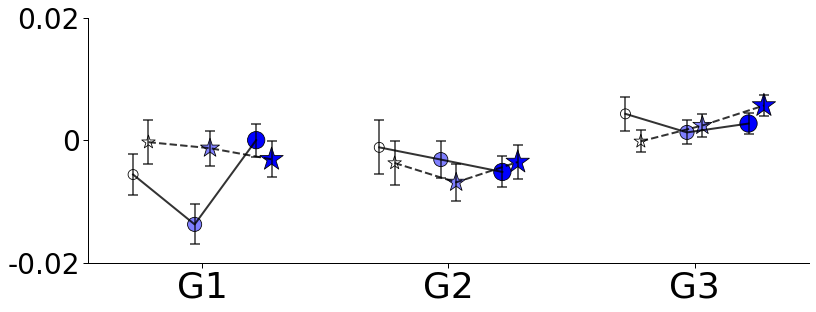

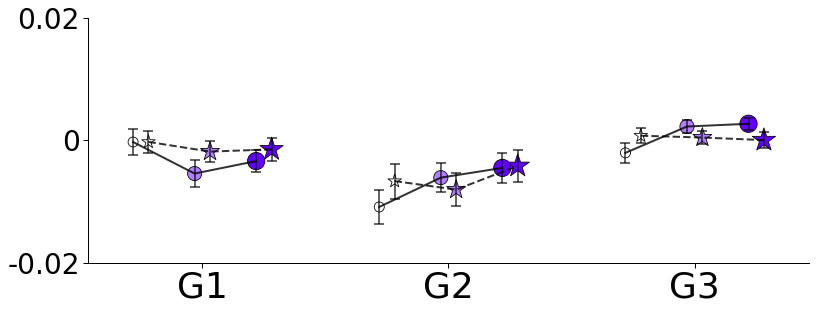

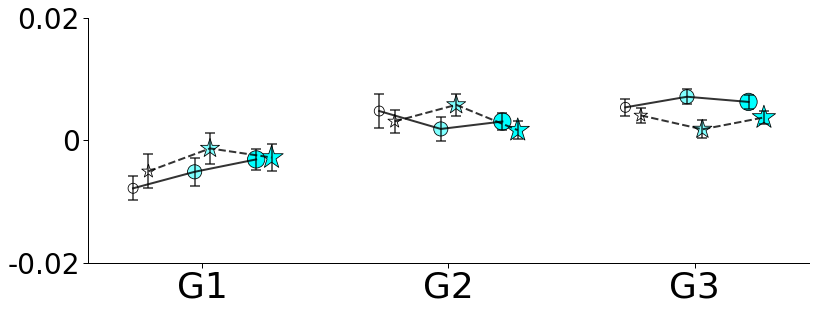

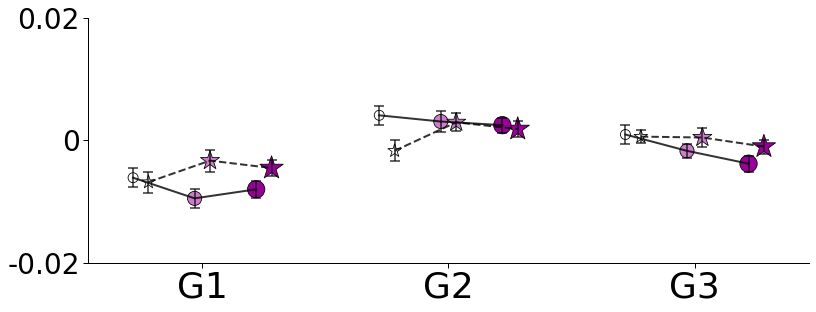

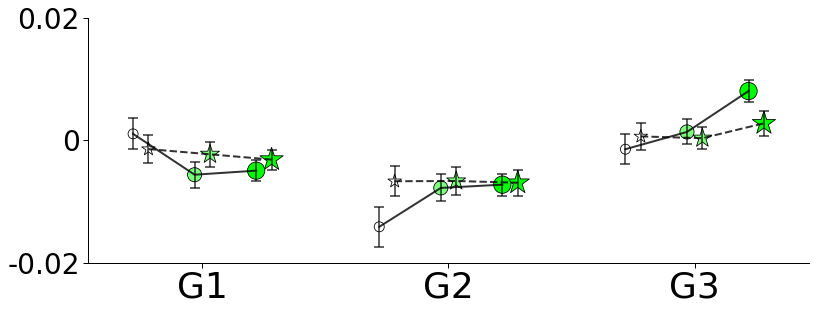

...

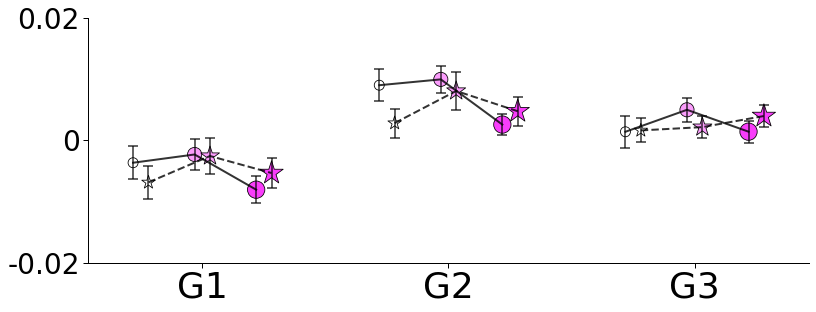

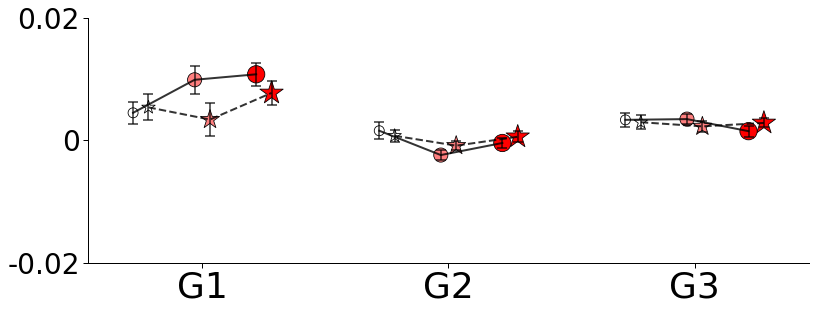

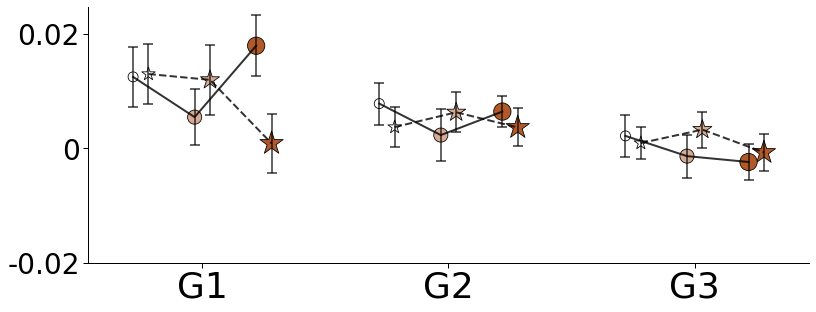

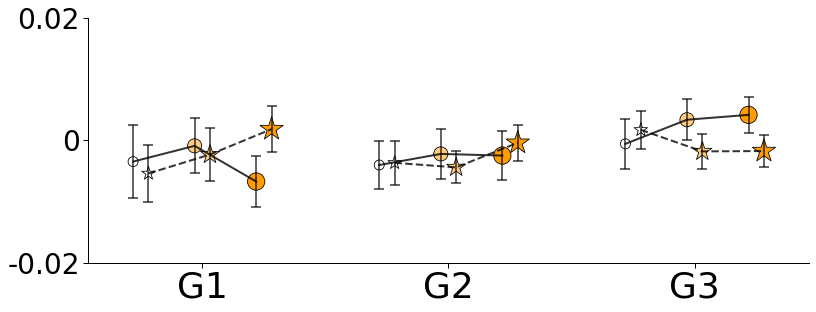

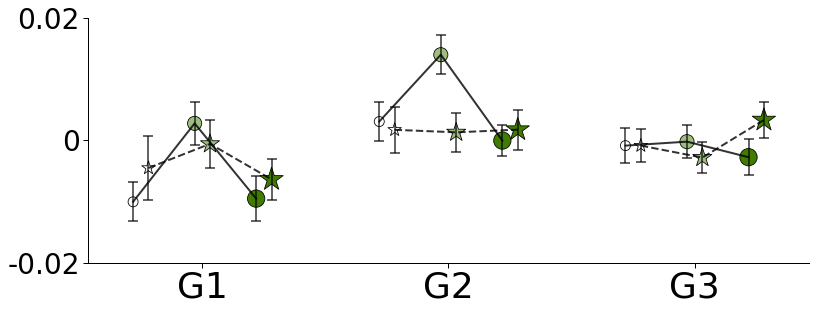

In [180]:
for i in range (12):
  fu.plot_interact(mean, ste, i, 'inter', GSR=True)